### Preps

In [1]:
import requests

import bs4

import time

import networkx as nx

import pandas as pd

import numpy as np 

import matplotlib.pyplot as plt

from matplotlib import font_manager as fm, rcParams

from itertools import combinations

plt.rcParams['font.sans-serif']=['SimHei'] #显示中文标签
plt.rcParams['axes.unicode_minus']=False   #这两行需要手动设置

pd.set_option('display.max_rows', 200)

pd.set_option('display.max_columns', 50)

### Data Quality Check - Dedup - 20240424 → 20240427

In [2]:
pwd

'C:\\Users\\lenovo\\a_Research\\Codes'

In [3]:
hc_df = pd.read_excel('C:/Users/lenovo/a_Research/input/Human_Capital.xlsx', header = 2)

In [11]:
hc_df.describe(include=[object])

,name,blood,homeplace,constellation,academy1,academy2,Agency Co.,Note
count,2194,445,659,566,574,25,21,236
unique,2186,4,45,13,233,22,20,232
top,王萌,O,香港,处女座,北京电影学院,北京电影学院,开心麻花,杨幂
freq,2,178,91,58,86,3,2,2


In [9]:
hc_df.describe()

,male,year,month,height,seniority,no-edu,primer,junior,senior,college,master,higher,parents,spouse,bro-sis,children,teacher,precursor,classmate,Unnamed: 25,quarter,generation,voice actor
count,2194.000000,627.000000,648.000000,563.000000,676.000000,628.000000,627.000000,626.000000,627.000000,623.000000,621.000000,625.000000,6.720000e+02,6.740000e+02,6.730000e+02,6.720000e+02,6.720000e+02,6.730000e+02,6.700000e+02,43.000000,196.000000,189.000000,76.000000
mean,0.508660,1978.878788,9.737654,173.349023,14.091716,0.038217,0.007974,0.031949,0.097289,0.731942,0.025765,0.003200,1.110353e+05,1.606049e+06,1.327090e+05,1.223128e+04,1.365362e+05,1.143172e+06,3.152643e+06,0.116279,2.561224,72.592593,0.605263
std,0.500039,12.248152,77.669547,7.697248,10.496159,0.571914,0.089014,0.176005,0.296587,0.443304,0.158561,0.056523,1.729271e+06,8.705087e+06,2.330887e+06,3.144248e+05,2.498407e+06,6.187144e+06,1.624034e+07,0.324353,1.110013,12.929767,0.492042
min,0.000000,1885.000000,1.000000,127.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,1.000000,0.000000,0.000000
25%,0.000000,1974.000000,4.000000,167.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2.000000,70.000000,0.000000
50%,1.000000,1981.000000,7.000000,174.000000,11.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,3.000000,70.000000,1.000000
75%,1.000000,1987.000000,10.000000,180.000000,18.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,4.000000,80.000000,1.000000
max,1.000000,2009.000000,1982.000000,195.000000,67.000000,14.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.104054e+07,1.238128e+08,4.387233e+07,8.150779e+06,6.255766e+07,6.403224e+07,1.913336e+08,1.000000,4.000000,90.000000,1.000000


In [5]:
hc_df

,male,name,year,month,height,blood,homeplace,constellation,academy1,academy2,seniority,no-edu,primer,junior,senior,college,master,higher,parents,spouse,bro-sis,children,teacher,precursor,classmate,Unnamed: 25,quarter,generation,voice actor,Agency Co.,Note
0,1,苏尚卿,1991.0,5.0,NaN,NaN,广西,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
1,1,杨洋,1991.0,9.0,180.0,AB,上海,处女座,中国人民解放军艺术学院,NaN,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,747621.0,NaN,NaN,NaN,0.0,NaN,潘阳
2,1,黄才伦,1985.0,8.0,175.0,NaN,NaN,狮子座,中国人民解放军艺术学院,NaN,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,279200.0,0.0,0.0,NaN,NaN,NaN,0.0,开心麻花,李立群
3,1,朱哲健,1993.0,10.0,182.0,NaN,NaN,NaN,北京电影学院,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
4,1,沈桦,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,1.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2189,0,刘欣,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2190,0,李桂花,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2191,0,宣璐,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2192,0,武东博,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Cleaning the duplicate values

In [7]:
hc_df.year.fillna(0)

0       1991.0
1       1991.0
2       1985.0
3       1993.0
4          0.0
         ...  
2189       0.0
2190       0.0
2191       0.0
2192       0.0
2193       0.0
Name: year, Length: 2194, dtype: float64

In [4]:
value_counts = hc_df.name.value_counts().to_frame().reset_index().rename(columns={'index':'name','name':'freq'})

value_counts[value_counts['freq']>1]

,name,freq
0,李滨,2
1,吕佩玉,2
2,刘冬,2
3,王萌,2
4,李菁,2
5,刘青,2
6,杜乔,2
7,李晔,2


<em><font style="font-family: Georgia" size = 4>For now we have eight actors with duplicate records</font></em>

In [7]:
dup_list = value_counts[value_counts['freq']>1].name.to_list()

hc_df[hc_df.loc[:,'name'].isin(dup_list)]

,male,name,year,month,height,blood,homeplace,constellation,academy1,academy2,seniority,no-edu,primer,junior,senior,college,master,higher,parents,spouse,bro-sis,children,teacher,precursor,classmate,Unnamed: 25,quarter,generation,voice actor,Agency Co.,Note
150,1,李晔,1982.0,1982.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,NaN,NaN
246,0,刘青,NaN,3.0,165.0,B,山东,白羊座,北京电影学院,NaN,5.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
426,1,李菁,1978.0,8.0,NaN,NaN,北京,狮子座,北京工业大学,NaN,11.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,金文声师胜杰
562,1,吕佩玉,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
936,1,杜乔,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
953,1,李滨,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
971,1,王萌,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1115,1,刘冬,NaN,NaN,169.0,A,吉林,射手座,中央戏剧学院,NaN,8.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1317,0,吕佩玉,NaN,NaN,NaN,NaN,台湾,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
1376,0,刘冬,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
hc_df.iloc[562,6] = '台湾'

In [9]:
hc_df.drop_duplicates(['name'],keep = 'first', inplace = True, ignore_index=True)

In [10]:
hc_df[hc_df.loc[:,'name'].isin(dup_list)]

,male,name,year,month,height,blood,homeplace,constellation,academy1,academy2,seniority,no-edu,primer,junior,senior,college,master,higher,parents,spouse,bro-sis,children,teacher,precursor,classmate,Unnamed: 25,quarter,generation,voice actor,Agency Co.,Note
150,1,李晔,1982.0,1982.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,NaN,NaN
246,0,刘青,NaN,3.0,165.0,B,山东,白羊座,北京电影学院,NaN,5.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
426,1,李菁,1978.0,8.0,NaN,NaN,北京,狮子座,北京工业大学,NaN,11.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,金文声师胜杰
562,1,吕佩玉,NaN,NaN,NaN,NaN,台湾,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
936,1,杜乔,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
953,1,李滨,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
971,1,王萌,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1115,1,刘冬,NaN,NaN,169.0,A,吉林,射手座,中央戏剧学院,NaN,8.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN


<em><font style="font-family: Georgia" size = 4> As you can see there, the dedup process is done</font></em>

In [13]:
hc_df.name.nunique()

2186

In [14]:
statement = {}
for stuff in hc_df.columns:
    statement[stuff] = hc_df[stuff].isna().sum()
    
statement

{'male': 0,
 'name': 0,
 'year': 1559,
 'month': 1538,
 'height': 1623,
 'blood': 1741,
 'homeplace': 1527,
 'constellation': 1620,
 'academy1': 1612,
 'academy2': 2161,
 'seniority': 1510,
 'no-edu': 1558,
 'primer': 1559,
 'junior': 1560,
 'senior': 1559,
 'college': 1563,
 'master': 1565,
 'higher': 1561,
 'parents': 1514,
 'spouse': 1512,
 'bro-sis': 1513,
 'children': 1514,
 'teacher': 1514,
 'precursor': 1513,
 'classmate': 1516,
 'Unnamed: 25': 2143,
 'quarter': 1990,
 'generation': 1997,
 'voice actor': 2111,
 'Agency Co.': 2165,
 'Note': 1950}

<em><font style="font-family: Georgia" size = 4>We have in total 2186 actors in the current dataset, with 1527 of them missing their homeplaces and 1612, 2161 of them missing academy1, 2</font></em>

#### Dedup is done & Saving

In [21]:
hc_df.to_excel('C:/Users/lenovo/a_Research/input/Human_Capital_1.0.0.xlsx', index = False )

#### Renaming

克里斯蒂安· should be 克里斯蒂安·贝尔

In [30]:
hc_df[hc_df.name.str.contains('克里斯蒂安·')]

,male,name,year,month,height,blood,homeplace,constellation,academy1,academy2,seniority,no-edu,primer,junior,senior,college,master,higher,parents,spouse,bro-sis,children,teacher,precursor,classmate,Unnamed: 25,quarter,generation,voice actor,Agency Co.,Note
56,1,克里斯蒂安·,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
hc_df.iloc[56,1] = '克里斯蒂安·贝尔'

In [35]:
hc_df.to_excel('C:/Users/lenovo/a_Research/input/Human_Capital_1.0.0.xlsx', index = False )

### Filling in the missing homeplace / 20240424

In [216]:
fill_in_list = hc_df[(hc_df.loc[:,'homeplace'].isna()) | (hc_df.loc[:,'academy1'].isna()) ].name.to_list()

[Web_Scraping_Example](https://blog.csdn.net/Steve_D/article/details/87970567?utm_medium=distribute.pc_relevant_download.none-task-blog-blogcommendfrombaidu-3.nonecase&depth_1-utm_source=distribute.pc_relevant_download.none-task-blog-blogcommendfrombaidu-3.nonecas)

In [18]:
import re
import requests

#下载网页内容
def download(url):
    if url is None:
        return None
    # 浏览器请求头
    user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.96 Safari/537.36'
    headers={'User-Agent':user_agent}
    r = requests.get(url,headers=headers)
    if r.status_code == 200:
        r.encoding = 'utf-8'
        return r.text
    return None

#提取百科词条简介
def get_data(html):
    #regex = re.compile('<meta name="description" content="(.*?)">')
    regex = re.compile('<div class="lemma-summary" label-module="lemmaSummary">(\s*)<div class="para" label-module="para">([\s\S]*?)</div>(\s*)</div>')
    #data = [('\n', 'Python是一种计算机程序设计语言。是一种动态的、面向对象的脚本语言，最初被设计用于编写自动化脚本(shell)，随着版本的不断更新和语言新功能的添加，越来越多被用于独立的、大型项目的开发。', '\n')]
    data = re.findall(regex, html)[0][1]
    return data

if __name__ == '__main__':
    #输入词条
    keyword = input('please input keyword:')
    url = 'http://baike.baidu.com/item/{}'.format(keyword)
    html_cont = download(url)
    try:
        data = get_data(html_cont)
        data = re.sub(r'<([\s\S]*?)>|&nbsp;|\n','',data)
        print(data)
        with open(keyword+'.txt', 'w', encoding='utf-8') as f:
            f.write(data)
            f.close()
    except Exception as e:
        print(keyword, 'is not exist,crawl failed !')

please input keyword:三浦贵大
三浦贵大（みうら たかひろ），1985年11月10日出生于日本东京，日本影视男演员，毕业于顺天堂大学。2010年，出演个人首部电影《RAILWAYS~49岁成为电车司机的男人的故事~》，从而正式进入演艺圈，并凭借该片获得了第35届日本报知电影奖获奖最佳新人奖[1]。2011年，首次担纲主演的电影《搞怪少年》上映[2-3]；同年，获得第34届日本电影学院奖最佳新人奖。2013年，其主演的剧情电影《监禁侦探》上映[4]。2015年，其主演的励志电影《武士人生》首映[5]。2016年，其出演的科幻电影《甜心战士：眼泪》首映[6]。2017年，其出演的刑侦剧《钱形警部》首播，在剧中饰演国木田晋太郎[7]。


### 单人测验

In [64]:
start = time.time()

user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.96 Safari/537.36'

headers={'User-Agent':user_agent}

search = '刘诗诗'

url = 'http://baike.baidu.com/item/{}'.format(search)

response = requests.get(url, headers=headers)

if response.status_code != 200:
    print('error! fail to retrieve')
    #break
    
response.encoding = response.apparent_encoding

html = response.text

soup = bs4.BeautifulSoup(html, 'html.parser')

seq1 = 'None'

seq2 = 'None'

link1 = soup.find_all('dt', class_='basicInfo-item name')

if len(link1) == 0:
    
    meta = soup.find_all('div', class_='para')
    
    index = 0
    
    for n, v in enumerate(meta):
        
        if '演员' in v or '制片' in v or '导演' in v or '影视' in v:
            
            index = n
        
    code = meta[index].find('a').get('data-lemmaid', None)
    
    url = 'http://baike.baidu.com/item/{}/{}'.format(search,code)

    response = requests.get(url, headers=headers)

    if response.status_code != 200:
        print('error! fail to retrieve')
    #break
    
    response.encoding = response.apparent_encoding

    html = response.text

    soup1 = bs4.BeautifulSoup(html, 'html.parser')
    
    link3 = soup1.find_all('dt', class_='basicInfo-item name')
    
    for n, v in enumerate(link3):
        
        info = v.text.replace('\s+','')

        if '出生' in info and '日期' not in info:

            seq1 = n

        if '毕业' in info:

            seq2 = n

    link4 = soup1.find_all('dd', class_='basicInfo-item value')

    try: 

        birth_place = link4[seq1].find('a').text

    except:

        birth_place = link4[seq1].text

    try:

        graduate_school = link4[seq2].find('a').text

    except:

        graduate_school = 'None'

    print("{0} is born in {1} and graduated from {2}".format(search, birth_place, graduate_school))

else:
    
    for n, v in enumerate(link1):

        info = v.text.replace('\s+','')

        if '出生' in info and '日期' not in info:

            seq1 = n

        if '毕业' in info:

            seq2 = n

    link2 = soup.find_all('dd', class_='basicInfo-item value')

    try: 

        birth_place = link2[seq1].text.strip('\n')

    except:

        birth_place = 'None'

    try:

        graduate_school = link2[seq2].text.strip('\n')

    except:

        graduate_school = 'None'

    print("{0} is born in {1} and graduated from {2}".format(search, birth_place, graduate_school))

time.sleep(8)

end = time.time()

print(str(end - start))

刘诗诗 is born in 北京市 and graduated from 北京舞蹈学院
16.00056266784668


In [164]:
fill_in_list

['苏尚卿',
 '黄才伦',
 '朱哲健',
 '沈桦',
 '李程彬',
 '蔡珩',
 '葛优',
 '马特·达蒙',
 '卢恒宇',
 '杨阳洋',
 '崔巍',
 '丹尼斯·吴',
 '金城武',
 '凯南·鲁兹',
 '翟巍',
 '张晋',
 '吴尊',
 '王宝强',
 '岳云鹏',
 '克里斯蒂安·',
 '休·杰克曼',
 '郑开元',
 '黄立行',
 '张磊',
 '张译',
 '陈飞宇',
 '林晖闵',
 '王大陆',
 '欧豪',
 '张家辉',
 '赵路',
 '郑智薰',
 '郭德纲',
 '布兰登·罗斯',
 '张东健',
 '李敏镐',
 '李准基',
 '张伟',
 '宋承宪',
 '余文乐',
 '阿如那',
 '权相宇',
 '朴灿烈',
 '丁笑宜',
 '安藤政信',
 '凤小岳',
 '张子琨',
 '车太贤',
 '范伟',
 '田壮壮',
 '安宰贤',
 '赵立新',
 '纪磊',
 '徐经纬',
 '李晔',
 '王骁',
 '覃培军',
 '金允石',
 '高全胜',
 '刘文卿',
 '胡清蓝',
 '邹兆龙',
 '艾德·维斯特',
 '池珍熙',
 '徐康',
 '王云飞',
 '赵汉唐',
 '唐宸禹',
 '钱小豪',
 '孟泉霖',
 '言承旭',
 '汤水雨',
 '石班瑜',
 '樊少皇',
 '郑少秋',
 '陈永忠',
 '陈虎',
 '姜星丘',
 '林强',
 '王衡',
 '陈诚',
 '陈文彬',
 '吴天昊',
 '王自健',
 '桂楠',
 '焦刚',
 '丁研',
 '宋威龙',
 '黄百鸣',
 '钟镇涛',
 '霍卫民',
 '朱时茂',
 '战卫华',
 '姚雷',
 '凯文史派西',
 '权相佑',
 '林海峰',
 '王学圻',
 '包小柏',
 '黄梓城',
 '林子聪',
 '三浦春马',
 '刘真佑',
 '塞缪尔·默瑟',
 '王迅',
 '元华',
 '孟飞',
 '郭太旭',
 '曹旭鹏',
 '马里奥·毛瑞',
 '赵铭',
 '刘锐',
 '毛毛头',
 '谢祖武',
 '曹三丰',
 '郭政建',
 '李胜贤',
 '骆达华',
 '黄裕翔',
 '许志安',
 '金基范',
 '郭品超',
 '西德尼玛',
 '赵本山',
 '曾冠源',
 '

### Step by Step improvement on Web-Scraping homeplace

### 04.27 最终测试版

In [222]:
start = time.time()

actor_dict = {}

user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.96 Safari/537.36'

headers={'User-Agent':user_agent}

for act in fill_in_list:
    
    actor_dict[act] = {}
    
    try:  
        
        url = 'http://baike.baidu.com/item/{}'.format(act)

        response = requests.get(url, headers=headers)

        if response.status_code != 200:
            print('error! fail to retrieve')
            #break

        response.encoding = response.apparent_encoding

        html = response.text

        soup = bs4.BeautifulSoup(html, 'html.parser')

        seq1 = 'None'

        seq2 = 'None'
        
        # 介绍栏
        link1 = soup.find_all('dt', class_='basicInfo-item name')

        # 多词条栏
        display_options = soup.find_all('li', class_='item')
        
        # 简介栏
        link_description = soup.find_all('div', class_ = 'para')
        
        if len(link1) == 0:

            meta = soup.find_all('div', class_='para')

            index = 0

            for n, v in enumerate(meta):
                
                text1 = v.text

                if '演员' in text1 or '制片' in text1 or '导演' in text1 or '影视' in text1:

                    index = n

            code = meta[index].find('a').get('data-lemmaid', None)

            url = 'http://baike.baidu.com/item/{}/{}'.format(act, code)

            response = requests.get(url, headers=headers)

            if response.status_code != 200:
                print('error! fail to retrieve')
            #break

            response.encoding = response.apparent_encoding

            html = response.text

            soup1 = bs4.BeautifulSoup(html, 'html.parser')

            link3 = soup1.find_all('dt', class_='basicInfo-item name')

            for n, v in enumerate(link3):

                info = v.text.replace('\s+','')

                if '出生地' in info and '日期' not in info:

                    seq1 = n

                if '毕业' in info:

                    seq2 = n

            link4 = soup1.find_all('dd', class_='basicInfo-item value')

            try: 

                birth_place = link4[seq1].text.replace('\n','')

            except:

                birth_place = 'None'

            try:

                graduate_school = link4[seq2].text.replace('\n','')

            except:

                graduate_school = 'None'
            
            actor_dict[act]['homeplace'] = birth_place
    
            actor_dict[act]['graduate'] = graduate_school
        
        elif len(link1) != 0 and ('演员' in link_description[0].text or '制片' in link_description[0].text or '导演' in link_description[0].text or '影视' in link_description[0].text):
            
            for n, v in enumerate(link1):

                info = v.text.replace('\s+','')

                if '出生地' in info and '日期' not in info:

                    seq1 = n

                if '毕业' in info:

                    seq2 = n

            link2 = soup.find_all('dd', class_='basicInfo-item value')

            try: 

                birth_place = link2[seq1].text.replace('\n','')

            except:

                birth_place = 'None'

            try:

                graduate_school = link2[seq2].text.replace('\n','')

            except:

                graduate_school = 'None'
            
            actor_dict[act]['homeplace'] = birth_place
    
            actor_dict[act]['graduate'] = graduate_school     
        
        else:
                  
            try:
                
                if ('演员' not in display_options[0].text or '制片' not in display_options[0].text or '导演' not in display_options[0].text or '影视' not in display_options[0].text):
                
                    potential_index_list = []

                    for n, v in enumerate(display_options):

                        text = v.text

                        if '演员' in text or '导演' in text or '影视' in text:

                            index = display_options[n].find('a').get('href', None).split('/')[-1].split('#')[0]

                            potential_index_list.append(index)          

                    url3 = f'http://baike.baidu.com/item/{act}/{potential_index_list[-1]}'

                    response = requests.get(url3, headers=headers)

                    if response.status_code != 200:

                        print('error! fail to retrieve')

                    #break

                    response.encoding = response.apparent_encoding

                    html2 = response.text

                    soup3 = bs4.BeautifulSoup(html2, 'html.parser')

                    link5 = soup3.find_all('dt', class_='basicInfo-item name')

                    for n, v in enumerate(link5):

                        info = v.text.replace('\s+','')

                        if '出生地' in info and '日期' not in info:

                            seq1 = n

                        if '毕业' in info:

                            seq2 = n

                    link6 = soup3.find_all('dd', class_='basicInfo-item value')

                    try: 

                        birth_place = link6[seq1].text.replace('\n','')

                    except:

                        birth_place = 'None'

                    try:

                        graduate_school = link6[seq2].text.replace('\n','')

                    except:

                        graduate_school = 'None'

                    actor_dict[act]['homeplace'] = birth_place

                    actor_dict[act]['graduate'] = graduate_school

            except:

                print(f'fail to extract information of {act}')           


        
    except:
        
        print('fail to extract information of {0}'.format(act))
    
    time.sleep(3)
    
    
end = time.time()

print(str(end - start))  


actor_df = pd.DataFrame(actor_dict).T.reset_index()

actor_df.to_csv('Apr24_Latest_Data.csv',index=False)

fail to extract information of 沈桦
fail to extract information of 杨阳洋
fail to extract information of 胡清蓝
fail to extract information of 艾德·维斯特
fail to extract information of 徐康
fail to extract information of 王云飞
fail to extract information of 吴天昊
fail to extract information of 丁研
fail to extract information of 黄梓城
fail to extract information of 孟飞
fail to extract information of 曹旭鹏
fail to extract information of 马里奥·毛瑞
fail to extract information of 曹三丰
fail to extract information of 黄裕翔
fail to extract information of 金基范
fail to extract information of 斯蒂芬·马布
fail to extract information of 约翰罗宾逊
fail to extract information of 刘承宙
fail to extract information of 李豪
fail to extract information of 田娃
fail to extract information of 高强
fail to extract information of 王津
fail to extract information of 詹姆斯·奥夫
fail to extract information of 余小宝
fail to extract information of MickThongraya
fail to extract information of 帕斯卡尔·格
fail to extract information of 刘栋升
fail to extract information of 何浚尉
f

In [217]:
pd.DataFrame(actor_dict).T.reset_index()

,index,graduate,homeplace
0,赵思源,中央戏剧学院[1],None


In [176]:
start = time.time()

actor_dict = {}

user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.96 Safari/537.36'

headers={'User-Agent':user_agent}

for act in fill_in_list:
    
    actor_dict[act] = {}
    
    try:  
        
        url = 'http://baike.baidu.com/item/{}'.format(act)

        response = requests.get(url, headers=headers)

        if response.status_code != 200:
            print('error! fail to retrieve')
            #break

        response.encoding = response.apparent_encoding

        html = response.text

        soup = bs4.BeautifulSoup(html, 'html.parser')

        seq1 = 'None'

        seq2 = 'None'

        link1 = soup.find_all('dt', class_='basicInfo-item name')

        if len(link1) == 0:

            meta = soup.find_all('div', class_='para')

            index = 0

            for n, v in enumerate(meta):

                if '演员' in v or '制片' in v or '导演' in v or '影视' in v:

                    index = n

            code = meta[index].find('a').get('data-lemmaid', None)

            url = 'http://baike.baidu.com/item/{}/{}'.format(act, code)

            response = requests.get(url, headers=headers)

            if response.status_code != 200:
                print('error! fail to retrieve')
            #break

            response.encoding = response.apparent_encoding

            html = response.text

            soup1 = bs4.BeautifulSoup(html, 'html.parser')

            link3 = soup1.find_all('dt', class_='basicInfo-item name')

            for n, v in enumerate(link3):

                info = v.text.replace('\s+','')

                if '出生' in info and '日期' not in info:

                    seq1 = n

                if '毕业' in info:

                    seq2 = n

            link4 = soup1.find_all('dd', class_='basicInfo-item value')

            try: 

                birth_place = link4[seq1].text.replace('\n','')

            except:

                birth_place = 'None'

            try:

                graduate_school = link4[seq2].text.replace('\n','')

            except:

                graduate_school = 'None'
            
            actor_dict[act]['homeplace'] = birth_place
    
            actor_dict[act]['graduate'] = graduate_school

        else:

            for n, v in enumerate(link1):

                info = v.text.replace('\s+','')

                if '出生' in info and '日期' not in info:

                    seq1 = n

                if '毕业' in info:

                    seq2 = n

            link2 = soup.find_all('dd', class_='basicInfo-item value')

            try: 

                birth_place = link2[seq1].text.replace('\n','')

            except:

                birth_place = 'None'

            try:

                graduate_school = link2[seq2].text.replace('\n','')

            except:

                graduate_school = 'None'
            
            actor_dict[act]['homeplace'] = birth_place
    
            actor_dict[act]['graduate'] = graduate_school
        
    except:
        
        print('fail to extract information of {0}'.format(act))
    
    time.sleep(3)
    
    
end = time.time()

print(str(end - start))  

fail to extract information of 克里斯蒂安·
fail to extract information of 张子琨
fail to extract information of 艾德·维斯特
fail to extract information of 徐康
fail to extract information of 郭太旭
fail to extract information of 马里奥·毛瑞
fail to extract information of 斯蒂芬·马布
fail to extract information of 凯蒂·萨瓦
fail to extract information of 约翰罗宾逊
fail to extract information of 刘承宙
fail to extract information of 李运佳
fail to extract information of 田娃
fail to extract information of 詹姆斯·奥夫
fail to extract information of 余小宝
fail to extract information of MickThongraya
fail to extract information of 帕斯卡尔·格
fail to extract information of 赖虹宇
fail to extract information of 亨利·伊安·?
fail to extract information of 辛朋
fail to extract information of 张佑赫（韩?
fail to extract information of 林永建
fail to extract information of 朴施厚（韩?
fail to extract information of 张惠鑫
fail to extract information of 汤龙
fail to extract information of 唐泽宗
fail to extract information of 周拉多杰
fail to extract information of 李权霖
fail to extract 

In [186]:
b.T.reset_index()

,index,homeplace,graduate
0,苏尚卿,广西，柳州,None
1,黄才伦,辽宁鞍山,解放军艺术学院
2,朱哲健,None,None
3,沈桦,None,None
4,李程彬,台湾,None
...,...,...,...
1636,刘欣,定陶国定陶县（今山东定陶）,None
1637,李桂花,None,黑龙江大学
1638,宣璐,江苏省南京市,北京舞蹈学院、中央戏剧学院
1639,武东博,山西省朔州市,None


In [181]:
actor_dict

{'苏尚卿': {'homeplace': '广西，柳州', 'graduate': 'None'},
 '黄才伦': {'homeplace': '辽宁鞍山', 'graduate': '解放军艺术学院'},
 '朱哲健': {'homeplace': 'None', 'graduate': 'None'},
 '沈桦': {'homeplace': 'None', 'graduate': 'None'},
 '李程彬': {'homeplace': '台湾', 'graduate': 'None'},
 '蔡珩': {'homeplace': '上海市', 'graduate': '中央戏剧学院'},
 '葛优': {'homeplace': '北京', 'graduate': 'None'},
 '马特·达蒙': {'homeplace': '马萨诸塞州剑桥市', 'graduate': 'None'},
 '卢恒宇': {'homeplace': 'None', 'graduate': '中央美术学院'},
 '杨阳洋': {'homeplace': '中国香港\xa0[2]\xa0', 'graduate': 'None'},
 '崔巍': {'homeplace': '山东青岛', 'graduate': '北京舞蹈学院'},
 '丹尼斯·吴': {'homeplace': '美国-德克萨斯州', 'graduate': '美国沙凡娜艺术设计大学'},
 '金城武': {'homeplace': '中国台湾省台北市', 'graduate': 'None'},
 '凯南·鲁兹': {'homeplace': '美国,北达科他州,狄金森', 'graduate': 'None'},
 '翟巍': {'homeplace': '上海市', 'graduate': '华东师范大学'},
 '张晋': {'homeplace': '重庆市', 'graduate': 'None'},
 '吴尊': {'homeplace': '文莱', 'graduate': '澳大利亚皇家墨尔本理工大学'},
 '王宝强': {'homeplace': '河北省邢台市南和区', 'graduate': 'None'},
 '岳云鹏': {'homeplace': '河南省濮阳

### Version I: Apr. 24th

In [131]:
start = time.time()

user_agent = 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.96 Safari/537.36'

headers={'User-Agent':user_agent}

search = '三浦贵大'

url = 'http://baike.baidu.com/item/{}'.format(search)

response = requests.get(url, headers=headers)

if response.status_code != 200:
    print('error! fail to retrieve')
    #break
    
response.encoding = response.apparent_encoding

html = response.text

soup = bs4.BeautifulSoup(html, 'html.parser')

seq1 = 'None'

seq2 = 'None'

link1 = soup.find_all('dt', class_='basicInfo-item name')

for n, v in enumerate(link1):
    
    info = v.text.replace('\s+','')
    
    if '出生' in info and '日期' not in info:
        
        seq1 = n
        
    if '毕业' in info:
        
        seq2 = n

link2 = soup.find_all('dd', class_='basicInfo-item value')

try: 
    
    birth_place = link2[seq1].text
    
except:
    
    birth_place = 'None'
    
try:
    
    graduate_school = link2[seq2].text
    
except:
    
    graduate_school = 'None'

print("{0} is born in {1} and graduated from {2}".format(search, birth_place, graduate_school))

end = time.time()

print(str(end - start))



三浦贵大 is born in 东京 and graduated from 顺天堂大学
6.7609217166900635


In [138]:
link2[seq1].text

'\n日本东京\n'

#### Creating Geographic List

In [368]:
%run ~/a_Research/Input/Geographic_Data.py


In [369]:
print(province_23)

print(province_23_str)

print(province_23_simp_list)

['河北省', '山西省', '辽宁省', '吉林省', '黑龙江省', '江苏省', '浙江省', '安徽省', '福建省', '江西省', '山东省', '河南省', '湖北省', '湖南省', '广东省', '海南省', '四川省', '贵州省', '云南省', '陕西省', '甘肃省', '青海省', '台湾省']
河北省, 山西省, 辽宁省, 吉林省, 黑龙江省, 江苏省, 浙江省, 安徽省, 福建省, 江西省, 山东省, 河南省, 湖北省, 湖南省, 广东省, 海南省, 四川省, 贵州省, 云南省, 陕西省, 甘肃省, 青海省, 台湾省,
['河北', '山西', '辽宁', '吉林', '黑龙江', '江苏', '浙江', '安徽', '福建', '江西', '山东', '河南', '湖北', '湖南', '广东', '海南', '四川', '贵州', '云南', '陕西', '甘肃', '青海', '台湾']


In [370]:
print(autonomous_region_5)

print(autonomous_region_5_str)

autonomous_region_5_simp_list

['内蒙古自治区', '广西壮族自治区', '西藏自治区', '宁夏回族自治区', '新疆维吾尔自治区']
内蒙古自治区, 广西壮族自治区, 西藏自治区, 宁夏回族自治区, 新疆维吾尔自治区,


['内蒙古', '广西', '西藏', '宁夏', '新疆']

In [371]:
print(municipality_4)

print(municipality_4_str)

municipality_4_simp_list

['北京市', '天津市', '上海市', '重庆市']
北京市, 天津市, 上海市, 重庆市,


['北京', '天津', '上海', '重庆']

In [372]:
print(special_administrative_region_2)

print(special_administrative_region_2_str)

special_administrative_region_2_simp_list

['香港特别行政区', '澳门特别行政区']
香港特别行政区, 澳门特别行政区,


['香港', '澳门']

In [594]:
foreign

['韩国',
 '英国',
 '泰国',
 '澳大利亚',
 '马来西亚',
 '新加坡',
 '澳大利亚',
 '瑞士',
 '加拿大',
 '罗马',
 '日本',
 '瑞典']

### Validating Actor List

In [37]:
actor_list_pk = pd.read_pickle('actor_list.pickled')

In [43]:
actor_list_df = pd.DataFrame(actor_list_pk).T.reset_index()

In [45]:
actor_list_df.to_csv('validation.csv')

In [36]:
actor_list = pd.read_pickle('actor_list.pickled')

actor_list

{'苏尚卿': {'homeplace': '广西，柳州', 'graduate': 'None'},
 '黄才伦': {'homeplace': '辽宁鞍山', 'graduate': '解放军艺术学院'},
 '朱哲健': {'homeplace': 'None', 'graduate': 'None'},
 '沈桦': {'homeplace': 'None', 'graduate': 'None'},
 '李程彬': {'homeplace': '台湾', 'graduate': 'None'},
 '蔡珩': {'homeplace': '上海市', 'graduate': '中央戏剧学院'},
 '葛优': {'homeplace': '北京', 'graduate': 'None'},
 '马特·达蒙': {'homeplace': '马萨诸塞州剑桥市', 'graduate': 'None'},
 '卢恒宇': {'homeplace': 'None', 'graduate': '中央美术学院'},
 '杨阳洋': {'homeplace': '中国香港\xa0[2]\xa0', 'graduate': 'None'},
 '崔巍': {'homeplace': '山东青岛', 'graduate': '北京舞蹈学院'},
 '丹尼斯·吴': {'homeplace': '美国-德克萨斯州', 'graduate': '美国沙凡娜艺术设计大学'},
 '金城武': {'homeplace': '中国台湾省台北市', 'graduate': 'None'},
 '凯南·鲁兹': {'homeplace': '美国,北达科他州,狄金森', 'graduate': 'None'},
 '翟巍': {'homeplace': '上海市', 'graduate': '华东师范大学'},
 '张晋': {'homeplace': '重庆市', 'graduate': 'None'},
 '吴尊': {'homeplace': '文莱', 'graduate': '澳大利亚皇家墨尔本理工大学'},
 '王宝强': {'homeplace': '河北省邢台市南和区', 'graduate': 'None'},
 '岳云鹏': {'homeplace': '河南省濮阳

In [374]:
actor_list_pk = pd.read_pickle('actor_list.pickled')

rename = pd.DataFrame(actor_list_pk).T.reset_index().rename(columns={'index':'actor','homeplace':'homeplace','graduate':'graduate'})

In [375]:
for row in actor_filled_df:
    actor_filled_df.loc[:, row]= actor_filled_df[row].astype('str')
    actor_filled_df.loc[:, row] = [stuff.strip('\n').replace('、','').replace(',','').replace('，','').replace('\xa0','') for stuff in actor_filled_df[row].values]

In [376]:
def hp_std(value):

    for pv in province_23_simp_list:

        if pv in value:

            return(pv)
            
        else:
            
            pass

    for mn in municipality_4_simp_list:

        if mn in value:

            return(mn)
            
        else:
            
            pass
        
    for sa in special_administrative_region_2_simp_list:
        
        if sa in value:
            
            return(sa)
        
        else:
            
            pass
        
    for ar in autonomous_region_5_simp_list:

        if ar in value:

            return(ar) 
        
        else:
            
            pass
        
    for st in us_state_50_simp_list:
        
        if st in value or '美国' in value:
            
            return('美国')
        
        else:
            
            pass
        
    for ct in foreign:
        
        if ct in value:
            
            return(ct)
        
        else:
            
            pass
        
    return(value)


In [377]:
actor_filled_df[actor_filled_df['actor'] == '休·杰克曼']

,actor,homeplace,graduate
20,休·杰克曼,澳大利亚-悉尼,悉尼科技大学伊迪斯科文大学


In [379]:
actor_filled_df['homeplace_std'] = actor_filled_df['homeplace'].apply(hp_std).astype('str')

In [380]:
Gen_1 = actor_filled_df[~(actor_filled_df['homeplace'] == actor_filled_df['homeplace_std']) & (actor_filled_df['homeplace_std'] != 'None')].reset_index(drop=True)

In [381]:
Gen_1

,actor,homeplace,graduate,homeplace_std
0,苏尚卿,广西柳州,None,广西
1,黄才伦,辽宁鞍山,解放军艺术学院,辽宁
2,蔡珩,上海市,中央戏剧学院,上海
3,马特·达蒙,马萨诸塞州剑桥市,None,美国
4,杨阳洋,中国香港[2],None,香港
5,崔巍,山东青岛,北京舞蹈学院,山东
6,丹尼斯·吴,美国-德克萨斯州,美国沙凡娜艺术设计大学,美国
7,金城武,中国台湾省台北市,None,台湾
8,凯南·鲁兹,美国北达科他州狄金森,None,美国
9,翟巍,上海市,华东师范大学,上海


In [383]:
lf_ov

,actor,homeplace,graduate,homeplace_std
2,吴尊,文莱,澳大利亚皇家墨尔本理工大学,文莱
4,郑智薰,首尔,檀国大学大众文化艺术研究生院,首尔
6,布兰登·罗斯,爱荷华州迪莫伊,爱荷华大学,爱荷华州迪莫伊
9,安宰贤,韩国,None,韩国
11,王骁,南京,加拿大三维动画专业6年,南京
12,金允石,釜山,东义大学德语系,釜山
14,池珍熙,首尔,明知专业大学,首尔
19,王衡,嘉靖四十一年九月九日（1562年10月6日）,None,嘉靖四十一年九月九日（1562年10月6日）
20,焦刚,中国,中央戏剧学院,中国
26,曹三丰,马来西亚,None,马来西亚


In [384]:
actor_filled_df[actor_filled_df['homeplace_std'] == '天南越国镜州青牛镇五里沟']

,actor,homeplace,graduate,homeplace_std
444,韩立,天南越国镜州青牛镇五里沟,None,天南越国镜州青牛镇五里沟


### Homeplace_Standardization

In [385]:
HpEdu_df = hc_df[['name','homeplace','academy1','academy2']]

In [388]:
actor_filled_df[['actor','graduate','homeplace_std']]

,actor,graduate,homeplace_std
0,苏尚卿,None,广西
1,黄才伦,解放军艺术学院,辽宁
2,朱哲健,None,None
3,沈桦,None,None
4,李程彬,None,台湾
...,...,...,...
1636,刘欣,None,山东
1637,李桂花,黑龙江大学,None
1638,宣璐,北京舞蹈学院中央戏剧学院,江苏
1639,武东博,None,山西


In [389]:
HpEdu_df_new = pd.merge(HpEdu_df,actor_filled_df[['actor','graduate','homeplace_std']], left_on='name',right_on='actor',how='left')

In [390]:
HpEdu_df_new.head()

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std
0,苏尚卿,广西,NaN,NaN,苏尚卿,None,广西
1,杨洋,上海,中国人民解放军艺术学院,NaN,NaN,NaN,NaN
2,黄才伦,NaN,中国人民解放军艺术学院,NaN,黄才伦,解放军艺术学院,辽宁
3,朱哲健,NaN,北京电影学院,NaN,朱哲健,None,None
4,沈桦,NaN,NaN,NaN,沈桦,None,None


In [395]:
for row in ['homeplace','homeplace_std','academy1','academy2','graduate_aft_std','graduate']:
    HpEdu_df_new.loc[:,row] = HpEdu_df_new[row].astype('str')

In [394]:
def dim_std(col1, col2):
    if col1 != 'nan':
        return(col1)
    elif col2 != 'nan' or col2 != 'None':
        return(col2)
    else:
        return(col1)

In [345]:
HpEdu_df_new[(HpEdu_df_new['homeplace'] == 'nan') & (HpEdu_df_new['homeplace_std'] != 'nan')]

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std,homeplace_aft_std


In [392]:
HpEdu_df_new['homeplace_aft_std'] = HpEdu_df_new.apply(lambda x: dim_std(x['homeplace'], x['homeplace_std']), axis = 1)

In [393]:
HpEdu_df_new['graduate_aft_std'] = HpEdu_df_new.apply(lambda x: dim_std(x['academy1'], x['graduate']), axis = 1)

In [364]:
HpEdu_df_new[(HpEdu_df_new['graduate'] != 'nan') & (HpEdu_df_new['graduate'] != 'None')]

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std,homeplace_aft_std,graduate_aft_std
2,黄才伦,nan,中国人民解放军艺术学院,nan,黄才伦,解放军艺术学院,nan,nan,中国人民解放军艺术学院
11,蔡珩,nan,中央戏剧学院,nan,蔡珩,中央戏剧学院,nan,nan,中央戏剧学院
17,卢恒宇,nan,中央美术学院,nan,卢恒宇,中央美术学院,nan,nan,中央美术学院
28,崔巍,nan,nan,nan,崔巍,北京舞蹈学院,nan,nan,北京舞蹈学院
30,丹尼斯·吴,nan,nan,nan,丹尼斯·吴,美国沙凡娜艺术设计大学,nan,nan,美国沙凡娜艺术设计大学
46,翟巍,nan,nan,nan,翟巍,华东师范大学,nan,nan,华东师范大学
48,吴尊,文莱,nan,nan,吴尊,澳大利亚皇家墨尔本理工大学,文莱,文莱,澳大利亚皇家墨尔本理工大学
59,休·杰克曼,nan,nan,nan,休·杰克曼,悉尼科技大学伊迪斯科文大学,nan,nan,悉尼科技大学伊迪斯科文大学
96,郑智薰,nan,nan,nan,郑智薰,檀国大学大众文化艺术研究生院,nan,nan,檀国大学大众文化艺术研究生院
100,布兰登·罗斯,nan,nan,nan,布兰登·罗斯,爱荷华大学,nan,nan,爱荷华大学


In [396]:
HpEdu_df_new[~(HpEdu_df_new['homeplace'].isin(full_hp_list)) & ~ (HpEdu_df_new['homeplace'].isna())]

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std,homeplace_aft_std,graduate_aft_std
2,黄才伦,nan,中国人民解放军艺术学院,nan,黄才伦,解放军艺术学院,辽宁,辽宁,中国人民解放军艺术学院
3,朱哲健,nan,北京电影学院,nan,朱哲健,None,None,None,北京电影学院
4,沈桦,nan,nan,nan,沈桦,None,None,None,None
11,蔡珩,nan,中央戏剧学院,nan,蔡珩,中央戏剧学院,上海,上海,中央戏剧学院
15,马特·达蒙,nan,nan,nan,马特·达蒙,None,美国,美国,None
...,...,...,...,...,...,...,...,...,...
2181,刘欣,nan,nan,nan,刘欣,None,山东,山东,None
2182,李桂花,nan,nan,nan,李桂花,黑龙江大学,None,None,黑龙江大学
2183,宣璐,nan,nan,nan,宣璐,北京舞蹈学院中央戏剧学院,江苏,江苏,北京舞蹈学院中央戏剧学院
2184,武东博,nan,nan,nan,武东博,None,山西,山西,None


In [398]:
HpEdu_df_new['name_comma'] = [str(name) + ',' for name in HpEdu_df_new['name']]

In [582]:
aff_hp = HpEdu_df_new.groupby('homeplace_std')['name_comma'].agg(sum)
aff_d = pd.DataFrame(aff_hp, index=aff_hp.index).reset_index()
aff_d.sort_values(['homeplace_std'],ascending=['False'])
aff_d['name_comma'] = [names.rstrip(',').split(',') for names in aff_d['name_comma']]
aff_d

,homeplace_std,name_comma
0,1184年,[陈承]
1,1271年,[王禎]
2,1922年10月,[张新岳]
3,1930年6月,[吕金]
4,1932年6月17日,[马瑞曼]
5,1935,[赵思源]
6,1943年,[李治中]
7,1990年12月24日,[应岳飞]
8,None,"[朱哲健, 沈桦, 卢恒宇, 克里斯蒂安·, 陈飞宇, 赵路, 张伟, 张子琨, 徐经纬, ..."
9,nan,"[杨洋, 吴京, 冯小刚, 梁朝伟, 李连杰, 井柏然, 张震, 袁文康, 王俊凯, 邓超,..."


In [431]:
af = pd.Series(aff_df['name_comma'])
af.index = aff_df['homeplace_std']

In [433]:
af= af.apply(pd.Series)
af

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544
homeplace_std,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1184年,陈承,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1271年,王禎,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1922年10月,张新岳,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1930年6月,吕金,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1932年6月17日,马瑞曼,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1935,赵思源,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1943年,李治中,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1990年12月24日,应岳飞,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
None,朱哲健,沈桦,卢恒宇,克里斯蒂安·,陈飞宇,赵路,张伟,张子琨,徐经纬,高全胜,艾德·维斯特,徐康,王云飞,孟泉霖,汤水雨,桂楠,丁研,霍卫民,战卫华,林海峰,塞缪尔·默瑟,郭太旭,曹旭鹏,马里奥·毛瑞,刘锐,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [435]:
type(af)
t1= af.iloc[10:].stack()
t1

homeplace_std    
上海             0      蔡珩
               1      翟巍
               2     孙祖杨
               3     朱雨辰
               4     芦芳生
                    ... 
黑龙江            40    吕红旭
               41    姜宏波
               42     彭玉
               43    金美伶
               44    张译木
Length: 1214, dtype: object

In [436]:
t2= t1.reset_index(level=1,drop=True).reset_index()

t2

,homeplace_std,0
0,上海,蔡珩
1,上海,翟巍
2,上海,孙祖杨
3,上海,朱雨辰
4,上海,芦芳生
...,...,...
1209,黑龙江,吕红旭
1210,黑龙江,姜宏波
1211,黑龙江,彭玉
1212,黑龙江,金美伶


In [437]:


### This command builds a graph B with the egdes in the DataFrame
### we've just created
B= nx.from_pandas_edgelist(t2, 'homeplace_std', 0)

### But it is not a bipartite graph yet..
### We need to tell NetworkX explicitly what nodes belong to which set.

### Let's add the nodes in the restaurant columns and declare that they are
### in the bipartite set 0
B.add_nodes_from(t2['homeplace_std'], bipartite=0)
### Let's add the nodes in the 0 columns and declare that they are
### in the bipartite set 1
B.add_nodes_from(t2[0], bipartite=1)


In [441]:
Hometown = {n for n, d in B.nodes(data=True) if d['bipartite'] == 0}
Actors = set(B) - Actors

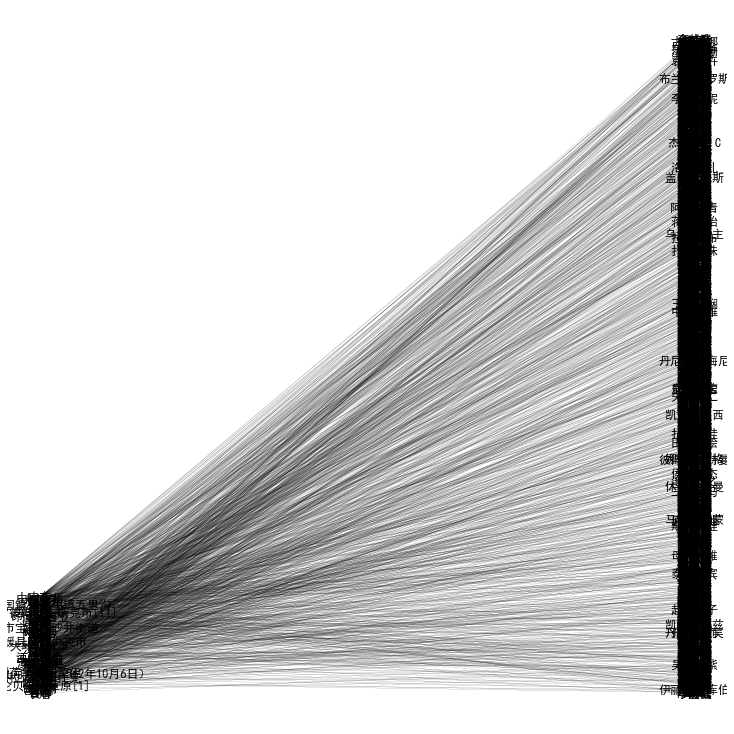

In [451]:
### Let's plot the bipartite graph
import matplotlib.pyplot as plt

### Here we are going to display one set at horizontal position 1 
### and the other at position 2
### Check the documentation for nx.draw to learn about these options
plt.figure(3,figsize=(10,10)) 
pos= dict()
pos.update( (n, (1, 20*i)) for i, n in enumerate(Hometown) ) # put nodes from X at x=1
pos.update( (n, (2, 10*i)) for i, n in enumerate(Actors) ) # put nodes from Y at x=2
nx.draw(B, pos=pos, node_size=2, width=0.1,with_labels=True)
plt.show()

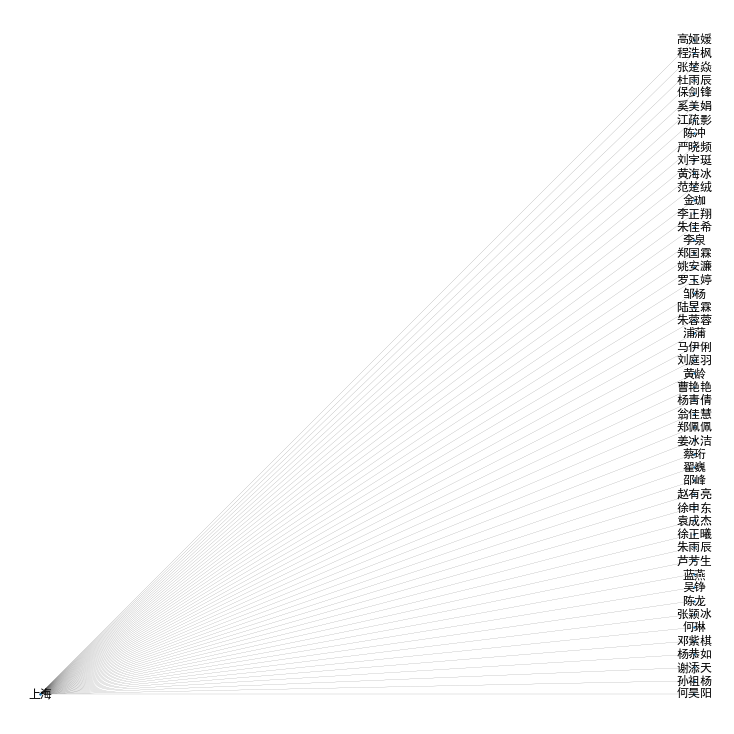

In [454]:
t3 = t2[t2['homeplace_std'] == '上海']



### This command builds a graph B with the egdes in the DataFrame
### we've just created
B= nx.from_pandas_edgelist(t3, 'homeplace_std', 0)

### But it is not a bipartite graph yet..
### We need to tell NetworkX explicitly what nodes belong to which set.

### Let's add the nodes in the restaurant columns and declare that they are
### in the bipartite set 0
B.add_nodes_from(t3['homeplace_std'], bipartite=0)
### Let's add the nodes in the 0 columns and declare that they are
### in the bipartite set 1
B.add_nodes_from(t3[0], bipartite=1)

Hometown = {n for n, d in B.nodes(data=True) if d['bipartite'] == 0}

Actors = set(B) - Actors

### Here we are going to display one set at horizontal position 1 
### and the other at position 2
### Check the documentation for nx.draw to learn about these options
plt.figure(3,figsize=(10,10)) 
pos= dict()
pos.update( (n, (1, 20*i)) for i, n in enumerate(Hometown) ) # put nodes from X at x=1
pos.update( (n, (2, 10*i)) for i, n in enumerate(Actors) ) # put nodes from Y at x=2
nx.draw(B, pos=pos, node_size=2, width=0.1,with_labels=True)
plt.show()


In [583]:
aff_d['act_combine'] = aff_d.apply(lambda x: comb(x['name_comma']), axis = 1)

In [587]:
nd_list_hp = list(set(aff_d.name_comma.sum()))

In [588]:
home_network = nx.Graph()
home_network.add_nodes_from(nd_list_hp)

In [591]:
edges_list = aff_d.act_combine.sum()

home_network.add_edges_from(edges_list)

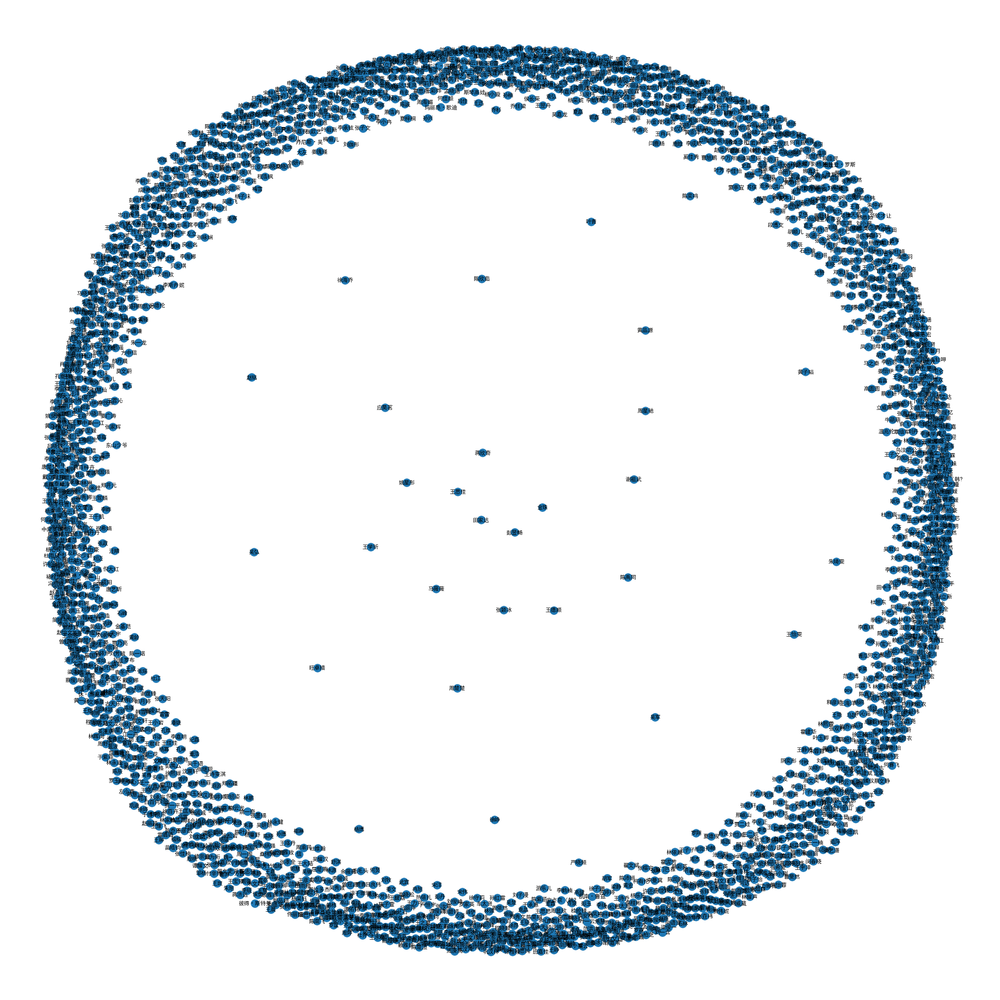

In [590]:
plt.figure(figsize=(30,30)) 

nx.draw(home_network,with_labels = True)

plt.show()

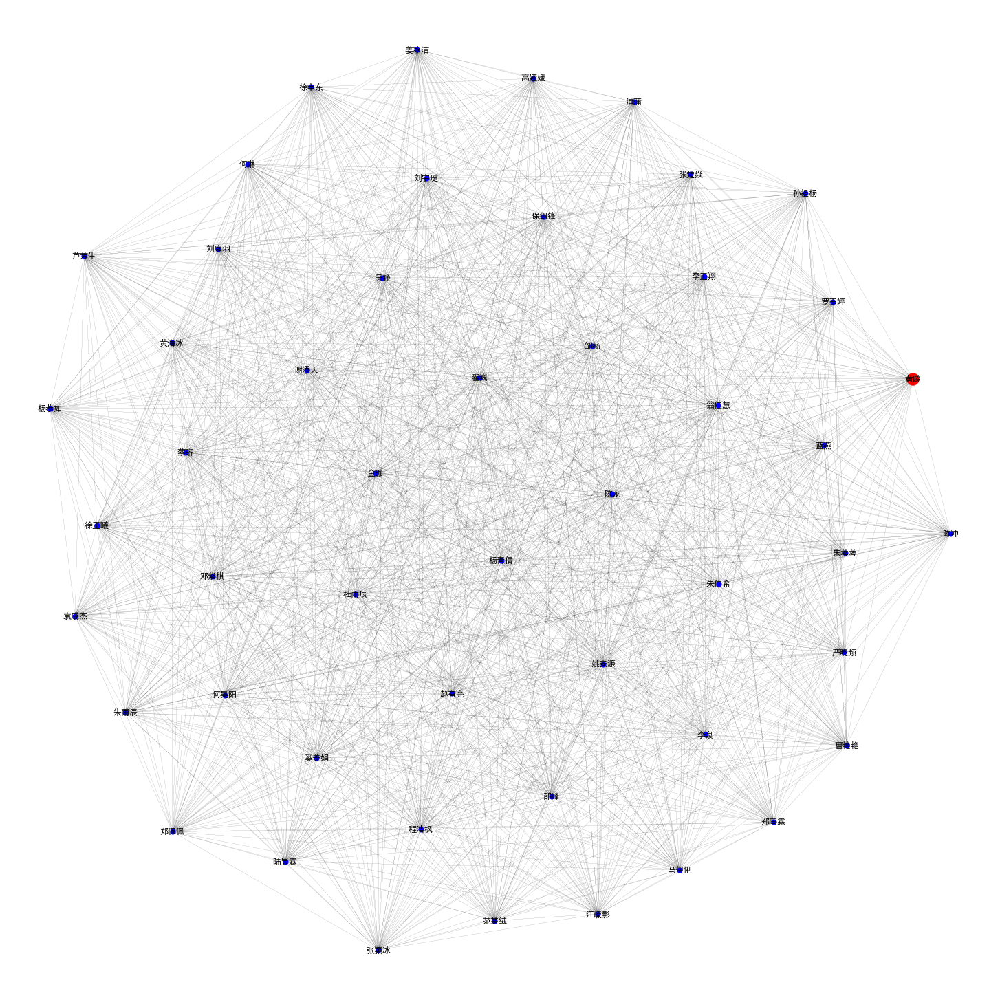

In [592]:
#### Ego-net is the network around a single person

###  Let's choose someone
hub='黄龄'

### Build the ego net 
hub_ego = nx.ego_graph(home_network, hub)

plt.figure(figsize=(20, 20)) 

# Draw graph
pos = nx.spring_layout(hub_ego)

nx.draw(hub_ego, pos, node_color='b', node_size=50, width=0.1, with_labels=True)

# Draw ego as large and red
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[hub], node_size=300, node_color='r')

plt.show()

### Education Bipartitie

In [603]:
HpEdu_df_new[HpEdu_df_new['name'] == '董成鹏']

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std,homeplace_aft_std,graduate_aft_std,name_comma
25,董成鹏,吉林,吉林建筑大学,nan,NaN,nan,nan,吉林,吉林建筑大学,"董成鹏,"


In [491]:
HpEdu_df_new

,name,homeplace,academy1,academy2,actor,graduate,homeplace_std,homeplace_aft_std,graduate_aft_std,name_comma
0,苏尚卿,广西,nan,nan,苏尚卿,None,广西,广西,None,"苏尚卿,"
1,杨洋,上海,中国人民解放军艺术学院,nan,NaN,nan,nan,上海,中国人民解放军艺术学院,"杨洋,"
2,黄才伦,nan,中国人民解放军艺术学院,nan,黄才伦,解放军艺术学院,辽宁,辽宁,中国人民解放军艺术学院,"黄才伦,"
3,朱哲健,nan,北京电影学院,nan,朱哲健,None,None,None,北京电影学院,"朱哲健,"
4,沈桦,nan,nan,nan,沈桦,None,None,None,None,"沈桦,"
...,...,...,...,...,...,...,...,...,...,...
2181,刘欣,nan,nan,nan,刘欣,None,山东,山东,None,"刘欣,"
2182,李桂花,nan,nan,nan,李桂花,黑龙江大学,None,None,黑龙江大学,"李桂花,"
2183,宣璐,nan,nan,nan,宣璐,北京舞蹈学院中央戏剧学院,江苏,江苏,北京舞蹈学院中央戏剧学院,"宣璐,"
2184,武东博,nan,nan,nan,武东博,None,山西,山西,None,"武东博,"


In [492]:
aff_hp = HpEdu_df_new.groupby('graduate_aft_std')['name_comma'].agg(sum)
aff_df = pd.DataFrame(aff_hp, index=aff_hp.index).reset_index()
aff_df.sort_values(['graduate_aft_std'],ascending=['False'])
aff_df['name_comma'] = [names.rstrip(',').split(',') for names in aff_df['name_comma']]
aff_df

,graduate_aft_std,name_comma
0,(TVB)第十期训练班,[连晋]
1,California International (USA) School,[陈晓东]
2,George Mason,[高圣远]
3,London School of Economics,[卢靖姗]
4,Macquarie University会计和日语专业,[邬祯琳]
...,...,...
732,麦考瑞大学,"[莫小奇, 莫小棋]"
733,黑龙江大学,[李桂花]
734,黑龙江省艺校,[刘之冰]
735,黑龙江省艺校中央戏剧学院,[马诗红]


In [565]:
def comb(col):
    if len(col) == 1:
        result = [(col[0],col[0])]
        return(result)
    else:
        result = list(combinations(col,2))
        return(result)

In [566]:
aff_df['act_combine'] = aff_df.apply(lambda x: comb(x['name_comma']), axis = 1)

In [567]:
aff_df.head()

,graduate_aft_std,name_comma,alumni,act_combine
0,(TVB)第十期训练班,[连晋],NaN,"[(连晋, 连晋)]"
1,California International (USA) School,[陈晓东],NaN,"[(陈晓东, 陈晓东)]"
2,George Mason,[高圣远],NaN,"[(高圣远, 高圣远)]"
3,London School of Economics,[卢靖姗],NaN,"[(卢靖姗, 卢靖姗)]"
4,Macquarie University会计和日语专业,[邬祯琳],NaN,"[(邬祯琳, 邬祯琳)]"


In [577]:
nd_list = list(set(aff_df.name_comma.sum()))

In [578]:
edu_network = nx.Graph()
edu_network.add_nodes_from(nodes_list)

In [575]:
list(set(aff_df.act_combine.sum()))

['何文杰',
 '李晨浩',
 '李雪健',
 '郑昊',
 '陈南飞',
 '彭丹',
 '伊丽莎·库伯',
 '张俪',
 '嘉男海林',
 '赵文瑄',
 '王小毅',
 '李佳韦',
 '赖虹宇',
 '安志杰',
 '张佳楠',
 '林依晨',
 '廖凡',
 '孙红雷',
 '韩宝凛',
 '杨猛',
 '杨清',
 '廖蔚蔚',
 '王力可',
 '娄淇',
 '梁小龙',
 '王彦华',
 '王若涵',
 '李威',
 '施展',
 '喻恩泰',
 '朱一龙',
 '洪海天',
 '梁景东',
 '骆妍倩',
 '林柏宏',
 '徐熙媛',
 '卢奇',
 '鲍振江',
 '唐嫣',
 '徐瑞阳',
 '刘骐',
 '应昊茗',
 '安钧璨',
 '秋瓷炫',
 '赵丽颖',
 '曾泳醍',
 '谈莉娜',
 '诺布钍呷',
 '胡天阳',
 '念贤儿',
 '赵倩',
 '蔡诗芸',
 '凯迪',
 '赵泳鑫',
 '王佩',
 '赖晶晶',
 '徐天硕',
 '倪景阳',
 '宋威龙',
 '苗皓钧',
 '焦妮',
 '邵兵',
 '图门巴雅',
 '沙溢',
 '张洪杰',
 '罗湘晋',
 '程媛媛',
 '李立群',
 '李鹤楠',
 '陆川',
 '唐宸禹',
 '李正翔',
 '杨心仪',
 '艾德·维斯特',
 '庞瀚辰',
 '邱胜翊',
 '姜瑰瑾',
 '信',
 '陈昊',
 '博尔吉特',
 '童伟',
 '宋佳伦',
 '苏菲',
 '葛优',
 '罗京民',
 '郭奕芯',
 '朱研',
 '潘婕',
 '袁菲',
 '张超',
 '王大治',
 '于月仙',
 '佟丽娅',
 '张迅',
 '钱小豪',
 '张佳宁',
 '戴金垸',
 '马天宇',
 '余小宝',
 '沈涛',
 '刘心悠',
 '潘昊',
 '庞璐佳',
 '张榕容',
 '赵路',
 '夏锦菊',
 '王雪沁',
 '严晓频',
 '殷桃',
 '温兆伦',
 '李易祥',
 '金范',
 '黄海',
 '莫小奇',
 '黎楚楚',
 '张涵予',
 '谭佑铭',
 '汤龙',
 '褚栓忠',
 '刘圆圆',
 '钟佳琪',
 '田家大',
 '徐熙娣',
 '凯南·鲁兹',
 '李昕芸',
 '石锦航',
 '阚清子',
 '林鹏',
 '

In [579]:
edges_list = aff_df.act_combine.sum()

edu_network.add_edges_from(edges_list)

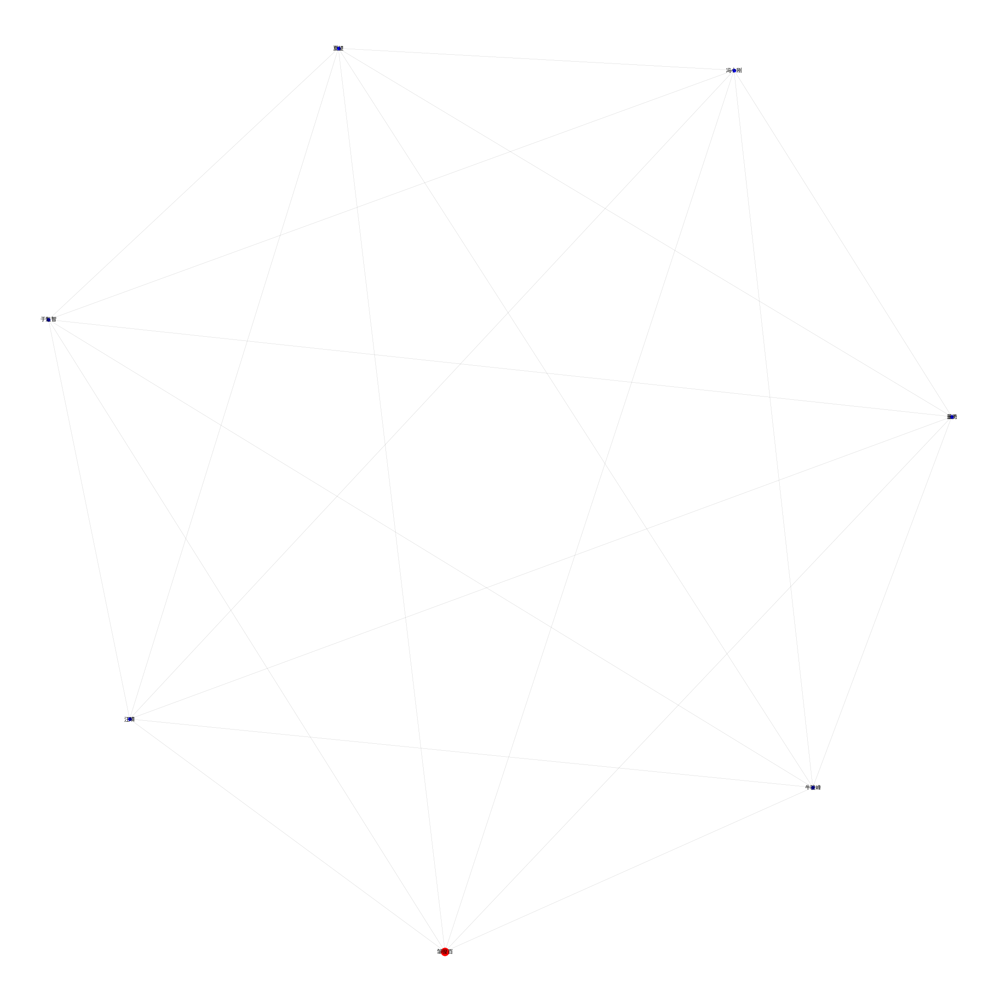

In [598]:
#### Ego-net is the network around a single person

###  Let's choose someone
hub='邹俊百'

### Build the ego net 
hub_ego = nx.ego_graph(edu_network, hub)

plt.figure(figsize=(30, 30)) 

# Draw graph
pos = nx.spring_layout(hub_ego)
nx.draw(hub_ego, pos, node_color='b', node_size=50, width=0.1, with_labels=True)

# Draw ego as large and red
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[hub], node_size=300, node_color='r')

plt.show()

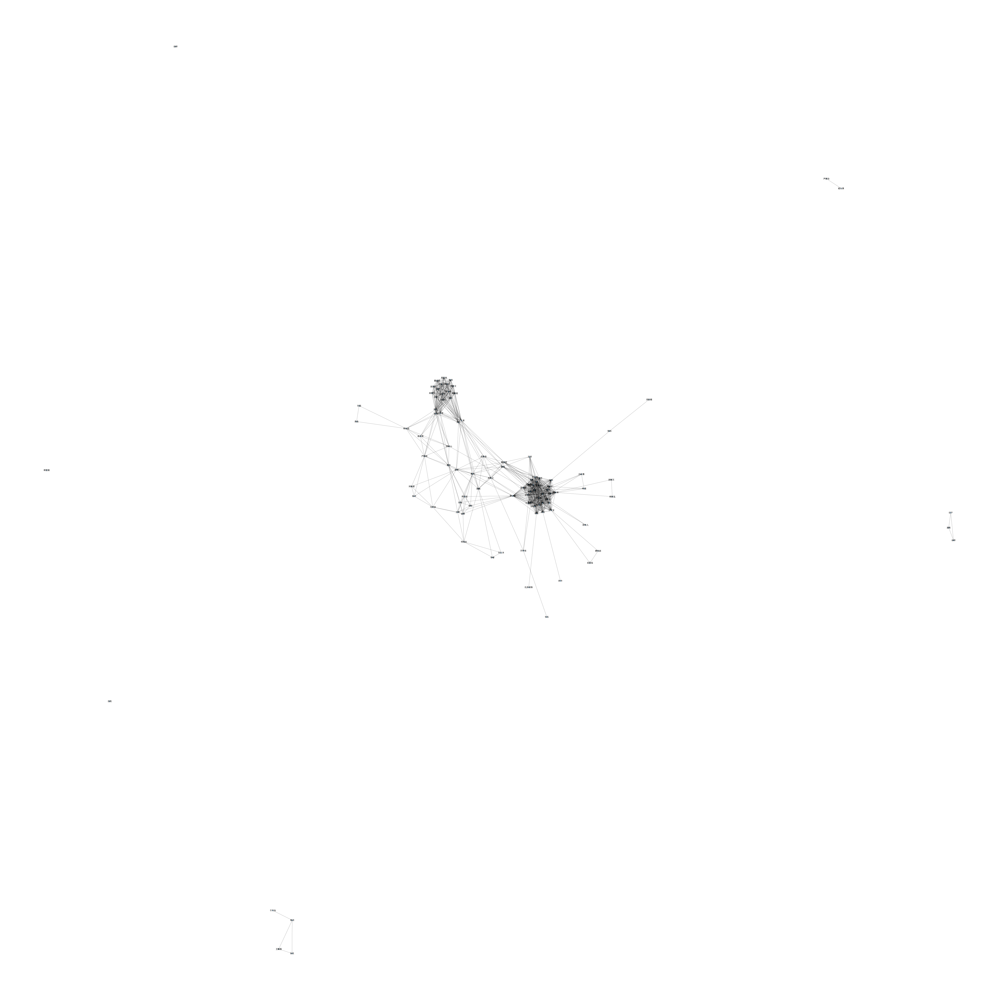

In [601]:
### We can induce a subgraph of the previous graph by 
### specifying which nodes should be in the subgraph

### Let's create a random sample of 30 people
sample= pd.Series(list(nd_list)).sample(100)

### Call the subgraph function and pass the list of people
### In this case, we will pass our sample
SS= edu_network.subgraph(sample)

plt.figure(figsize=(80,80))

### Let's look at the subgraph
nx.draw(SS, node_size=10, width=0.4, with_labels = True)

plt.show()

In [599]:
plt.figure(figsize=(100,100)) 

nx.draw(edu_network,with_labels = True, node_size=15, width=1)

plt.show()

In [493]:
af = pd.Series(aff_df['name_comma'])
af.index = aff_df['graduate_aft_std']

In [495]:
af= af.apply(pd.Series)
af.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,...,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671
graduate_aft_std,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
(TVB)第十期训练班,连晋,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
California International (USA) School,陈晓东,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
George Mason,高圣远,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
London School of Economics,卢靖姗,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Macquarie University会计和日语专业,邬祯琳,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [508]:
type(af)
t5= af.iloc[10:].stack()
t6= t5.reset_index(level=1,drop=True).reset_index()
t6

,graduate_aft_std,0
0,上海东方文化学院北京电影学院,傅亨
1,上海复旦大学药学院[3],李大鹏
2,上海外国语大学长江商学院,陈辰
3,上海外国语学院,陈冲
4,上海工程技术大学,高娅媛
...,...,...
1500,麦考瑞大学,莫小棋
1501,黑龙江大学,李桂花
1502,黑龙江省艺校,刘之冰
1503,黑龙江省艺校中央戏剧学院,马诗红


In [509]:
### This command builds a graph B with the egdes in the DataFrame
### we've just created
C= nx.from_pandas_edgelist(t6, 'graduate_aft_std', 0)

### But it is not a bipartite graph yet..
### We need to tell NetworkX explicitly what nodes belong to which set.

### Let's add the nodes in the restaurant columns and declare that they are
### in the bipartite set 0
C.add_nodes_from(t6['graduate_aft_std'], bipartite=0)
### Let's add the nodes in the 0 columns and declare that they are
### in the bipartite set 1
C.add_nodes_from(t6[0], bipartite=1)


In [510]:
Edu = {n for n, d in C.nodes(data=True) if d['bipartite'] == 0}
Actors = set(B) - Edu

In [514]:
t6

0        傅亨
1       李大鹏
2        陈辰
3        陈冲
4       高娅媛
       ... 
1500    莫小棋
1501    李桂花
1502    刘之冰
1503    马诗红
1504    倪景阳
Name: 0, Length: 1505, dtype: object

### Creating the film network

In [455]:
df = pd.read_csv('table.csv', encoding = "GBK", header=1)

df.head()

,code,year,month,name,box2019,box,director1,director2,dfans,dst,ms1,ms1fans,ms1st,fs1,fs1fans,fs1st,ms2,ms2fans,ms2st,fs2,fs2fans,fs2st,guests,gsfans,gst,type,love,crime,history,other,family,animated,comedy,action,jjuj,jjij,hbij,jxiaj,jmaj,jluj,bhuj,jxioj,rank,total,sequels,remake,prize
0,1,2009,9,建国大业,5.369108,4.16,韩三平,黄建新,5456.0,2011/3/23,唐国强,37179.0,2011/3/12,许晴,8381242.0,2011/3/23,张国立,475478.0,2011/3/13,邬君梅,403431.0,2010/3/2,陈坤,78031895.0,2009/11/13,历史、战争,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,6.1,111541.0,0.0,1.0,2011华表奖优秀故事片奖、2010金鹿奖最佳华语故事片、2010百花奖最佳影片奖
1,2,2009,12,十月围城,3.755794,2.91,陈德森,NaN,545022.0,2010/3/9,甄子丹,6078838.0,2010/3/30,范冰冰,39431925.0,2013/12/25,梁家辉,0.0,NaN,李宇春,3517480.0,2009/9/10,谢霆锋,NaN,NaN,历史、战争,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,7.7,204435.0,0.0,1.0,2011华表奖优秀合拍片奖、2010金像奖最佳电影第47届台湾电影金马奖
2,3,2009,1,赤壁(下),3.368599,2.61,吴宇森,NaN,233738.0,2015/7/16,梁朝伟,1504853.0,2010/5/27,赵薇,73974278.0,2009/10/28,金城武,0.0,NaN,林志玲,9901922.0,2009/8/28,佟大为,22612580.0,2009/8/28,历史、战争,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,6.5,84042.0,1.0,1.0,2009华表奖优秀合拍片奖，香港金像奖最佳剪接
3,4,2009,12,三枪拍案惊奇,3.329879,2.58,张艺谋,NaN,0.0,NaN,孙红雷,11381520.0,2009/9/29,闫妮,377610.0,2011/6/28,小沈阳,12835247.0,2009/8/28,NaN,NaN,NaN,赵本山,5524638.0,2010/11/20,惊悚、悬疑、犯罪,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.7,68824.0,0.0,0.0,NaN
4,5,2009,9,风声,2.891058,2.24,高群书,陈国富,0.0,NaN,黄晓明,39327844.0,2010/4/14,周迅,4309367.0,2011/5/4,苏有朋,22655876.0,2010/12/14,李冰冰,35118659.0,2009/8/28,张涵予,636765.0,2009/8/28,惊悚、悬疑、犯罪,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,8.0,234005.0,0.0,1.0,2011华表奖优秀合拍片奖第30届百花奖第46届金马奖


In [456]:
df = df[df['box2019'] > 0.5]

In [457]:
attr_list = ['name','box2019','director1','director2','ms1', 'fs1','ms2','fs2','guests']

In [458]:
df = df[attr_list]

df

,name,box2019,director1,director2,ms1,fs1,ms2,fs2,guests
0,建国大业,5.369108,韩三平,黄建新,唐国强,许晴,张国立,邬君梅,陈坤
1,十月围城,3.755794,陈德森,NaN,甄子丹,范冰冰,梁家辉,李宇春,谢霆锋
2,赤壁(下),3.368599,吴宇森,NaN,梁朝伟,赵薇,金城武,林志玲,佟大为
3,三枪拍案惊奇,3.329879,张艺谋,NaN,孙红雷,闫妮,小沈阳,NaN,赵本山
4,风声,2.891058,高群书,陈国富,黄晓明,周迅,苏有朋,李冰冰,张涵予
...,...,...,...,...,...,...,...,...,...
2383,人间-喜剧,0.623770,孙周,NaN,艾伦,王智,鲁诺,NaN,NaN
2384,亲爱的新年好,0.622030,彭宥纶,NaN,魏大勋,白百何,李建义,张子枫,NaN
2385,特警队,0.565970,丁晟,NaN,凌潇肃,金晨,贾乃亮,NaN,NaN
2386,碟仙,0.517663,廉涛,NaN,范逸臣,黄奕,程小夏,NaN,NaN


In [459]:
df.loc[:, ['name', 'director1', 'director2', 'ms1', 'fs1', 'ms2', 'fs2',
       'guests']] = df[['name', 'director1', 'director2', 'ms1', 'fs1', 'ms2', 'fs2',
       'guests']].astype('str')

In [460]:
for attr in attr_list:
    
    if attr != 'box2019':
        
        df.loc[:, attr] = df[attr].apply(lambda x: x.replace(' ',',').lstrip(' ').rstrip(' '))

df.loc[:,'director1'] = df['director1'].replace('nan', pd.NA)

df = df[~df['director1'].isna()].reset_index(drop=True)

In [461]:
df.loc[:, 'co_acts'] = df['director1'] + ',' + df['ms1'] + ',' + df['fs1'] + ',' + df['ms2'] + ',' + df['fs2'] + ',' +  df['guests']

df.loc[:, 'co'] = df['ms1'] + ',' + df['fs1'] + ',' + df['ms2'] + ',' + df['fs2'] + ',' +  df['guests']

In [462]:
df.loc[:, 'co_acts'] = df['co_acts'].apply(lambda x: x.replace('nan,', '').replace(',nan','').split(','))

df.loc[:, 'co'] = df['co'].apply(lambda x: x.replace('nan,', '').replace(',nan','').split(','))

df['indicator'] = [1 if a in b else 0 for a, b in zip(df['director1'], df['co'])]

df[['co_acts','co','indicator']]

,co_acts,co,indicator
0,"[韩三平, 唐国强, 许晴, 张国立, 邬君梅, 陈坤]","[唐国强, 许晴, 张国立, 邬君梅, 陈坤]",0
1,"[陈德森, 甄子丹, 范冰冰, 梁家辉, 李宇春, 谢霆锋]","[甄子丹, 范冰冰, 梁家辉, 李宇春, 谢霆锋]",0
2,"[吴宇森, 梁朝伟, 赵薇, 金城武, 林志玲, 佟大为]","[梁朝伟, 赵薇, 金城武, 林志玲, 佟大为]",0
3,"[张艺谋, 孙红雷, 闫妮, 小沈阳, 赵本山]","[孙红雷, 闫妮, 小沈阳, 赵本山]",0
4,"[高群书, 黄晓明, 周迅, 苏有朋, 李冰冰, 张涵予]","[黄晓明, 周迅, 苏有朋, 李冰冰, 张涵予]",0
...,...,...,...
532,"[孙周, 艾伦, 王智, 鲁诺]","[艾伦, 王智, 鲁诺]",0
533,"[彭宥纶, 魏大勋, 白百何, 李建义, 张子枫]","[魏大勋, 白百何, 李建义, 张子枫]",0
534,"[丁晟, 凌潇肃, 金晨, 贾乃亮]","[凌潇肃, 金晨, 贾乃亮]",0
535,"[廉涛, 范逸臣, 黄奕, 程小夏]","[范逸臣, 黄奕, 程小夏]",0


In [484]:
df_bi = df[['co_acts','indicator']]

df_bi.loc[:,'collab'] = df_bi['co_acts'].apply(lambda x: [*combinations(x, 2)])


C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\indexing.py:1596: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


In [490]:
celebrity_network = nx.Graph()

nodes_list = df.co_acts.sum()

print(len(nodes_list))

nodes_list = list(set(nodes_list))

print(len(nodes_list))

celebrity_network.add_nodes_from(nodes_list)

edges_list = df_bi.collab.sum()

celebrity_network.add_edges_from(edges_list)

plt.figure(figsize=(100,100)) 

nx.draw(celebrity_network,with_labels = True)

plt.show()

2541
1035


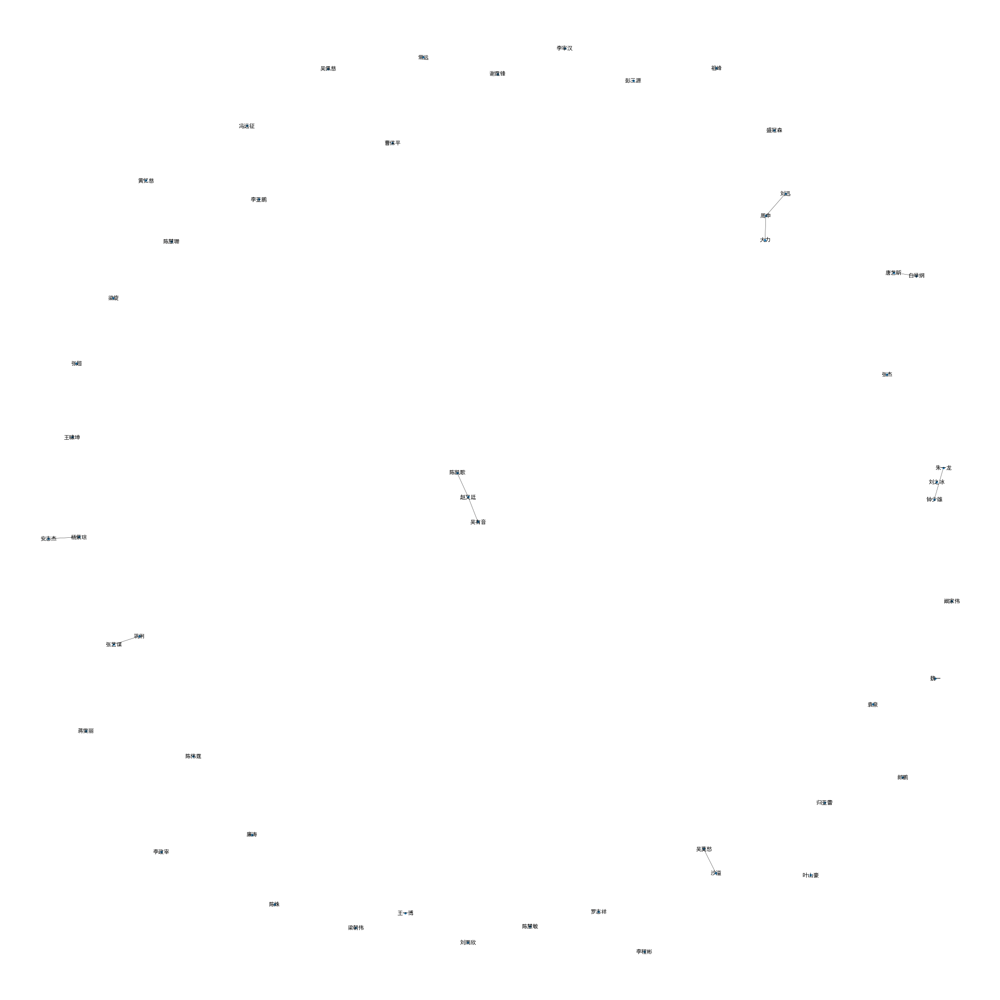

In [486]:
### We can induce a subgraph of the previous graph by 
### specifying which nodes should be in the subgraph

### Let's create a random sample of 30 people
sample= pd.Series(list(nodes_list)).sample(50)

### Call the subgraph function and pass the list of people
### In this case, we will pass our sample
SS= celebrity_network.subgraph(sample)

plt.figure(figsize=(30,30)) 

### Let's look at the subgraph
nx.draw(SS, node_size=15, width=0.5, with_labels = True)

plt.show()

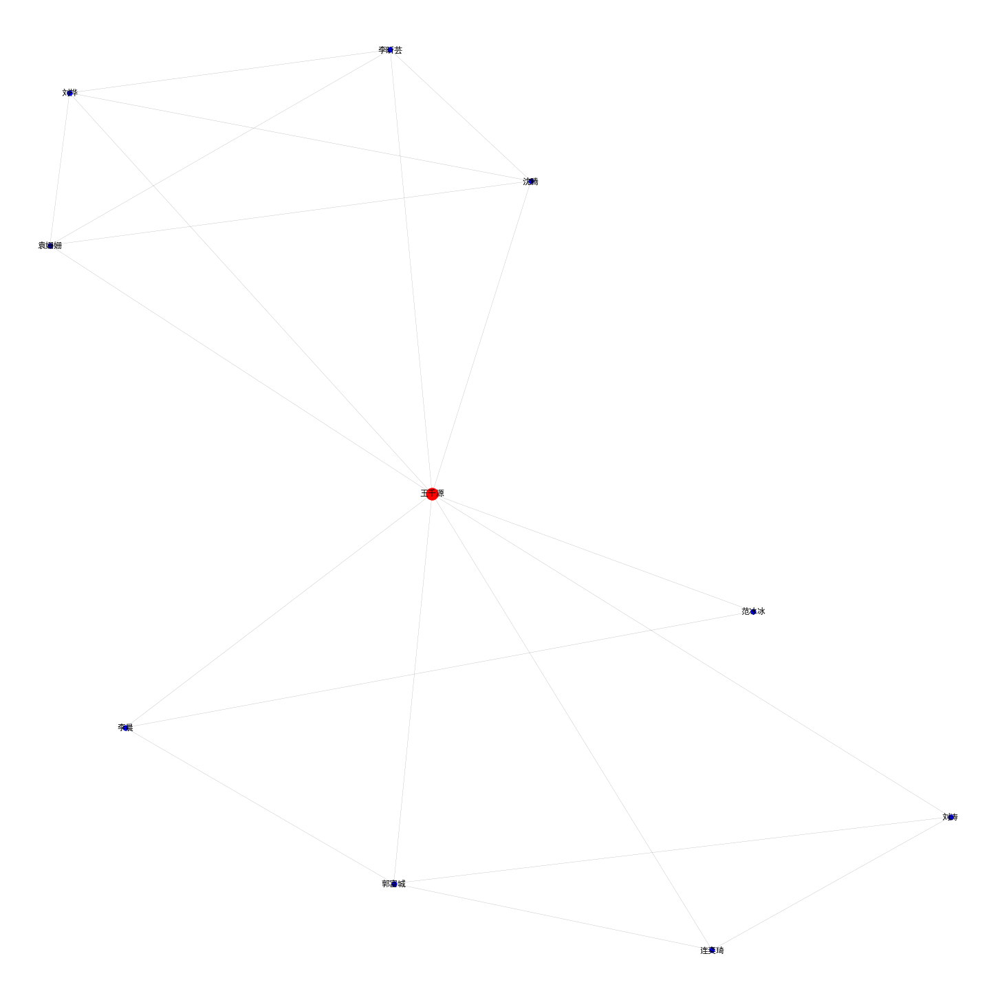

In [489]:
#### Ego-net is the network around a single person

###  Let's choose someone
hub='王千源'

### Build the ego net 
hub_ego = nx.ego_graph(celebrity_network, hub)

plt.figure(figsize=(20, 20)) 

# Draw graph
pos = nx.spring_layout(hub_ego)
nx.draw(hub_ego, pos, node_color='b', node_size=50, width=0.1, with_labels=True)

# Draw ego as large and red
nx.draw_networkx_nodes(hub_ego, pos, nodelist=[hub], node_size=300, node_color='r')

plt.show()

In [464]:
df['co_acts_str'] = df['co_acts'].apply(lambda x: "".join(item + ',' for item in x))

df

,name,box2019,director1,director2,ms1,fs1,ms2,fs2,guests,co_acts,co,indicator,co_acts_str
0,建国大业,5.369108,韩三平,黄建新,唐国强,许晴,张国立,邬君梅,陈坤,"[韩三平, 唐国强, 许晴, 张国立, 邬君梅, 陈坤]","[唐国强, 许晴, 张国立, 邬君梅, 陈坤]",0,"韩三平,唐国强,许晴,张国立,邬君梅,陈坤,"
1,十月围城,3.755794,陈德森,nan,甄子丹,范冰冰,梁家辉,李宇春,谢霆锋,"[陈德森, 甄子丹, 范冰冰, 梁家辉, 李宇春, 谢霆锋]","[甄子丹, 范冰冰, 梁家辉, 李宇春, 谢霆锋]",0,"陈德森,甄子丹,范冰冰,梁家辉,李宇春,谢霆锋,"
2,赤壁(下),3.368599,吴宇森,nan,梁朝伟,赵薇,金城武,林志玲,佟大为,"[吴宇森, 梁朝伟, 赵薇, 金城武, 林志玲, 佟大为]","[梁朝伟, 赵薇, 金城武, 林志玲, 佟大为]",0,"吴宇森,梁朝伟,赵薇,金城武,林志玲,佟大为,"
3,三枪拍案惊奇,3.329879,张艺谋,nan,孙红雷,闫妮,小沈阳,nan,赵本山,"[张艺谋, 孙红雷, 闫妮, 小沈阳, 赵本山]","[孙红雷, 闫妮, 小沈阳, 赵本山]",0,"张艺谋,孙红雷,闫妮,小沈阳,赵本山,"
4,风声,2.891058,高群书,陈国富,黄晓明,周迅,苏有朋,李冰冰,张涵予,"[高群书, 黄晓明, 周迅, 苏有朋, 李冰冰, 张涵予]","[黄晓明, 周迅, 苏有朋, 李冰冰, 张涵予]",0,"高群书,黄晓明,周迅,苏有朋,李冰冰,张涵予,"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
532,人间-喜剧,0.623770,孙周,nan,艾伦,王智,鲁诺,nan,nan,"[孙周, 艾伦, 王智, 鲁诺]","[艾伦, 王智, 鲁诺]",0,"孙周,艾伦,王智,鲁诺,"
533,亲爱的新年好,0.622030,彭宥纶,nan,魏大勋,白百何,李建义,张子枫,nan,"[彭宥纶, 魏大勋, 白百何, 李建义, 张子枫]","[魏大勋, 白百何, 李建义, 张子枫]",0,"彭宥纶,魏大勋,白百何,李建义,张子枫,"
534,特警队,0.565970,丁晟,nan,凌潇肃,金晨,贾乃亮,nan,nan,"[丁晟, 凌潇肃, 金晨, 贾乃亮]","[凌潇肃, 金晨, 贾乃亮]",0,"丁晟,凌潇肃,金晨,贾乃亮,"
535,碟仙,0.517663,廉涛,nan,范逸臣,黄奕,程小夏,nan,nan,"[廉涛, 范逸臣, 黄奕, 程小夏]","[范逸臣, 黄奕, 程小夏]",0,"廉涛,范逸臣,黄奕,程小夏,"


In [466]:
p = df['co_acts_str'].str.split(',', expand = True)

p

,0,1,2,3,4,5,6,7,8
0,韩三平,唐国强,许晴,张国立,邬君梅,陈坤,,None,None
1,陈德森,甄子丹,范冰冰,梁家辉,李宇春,谢霆锋,,None,None
2,吴宇森,梁朝伟,赵薇,金城武,林志玲,佟大为,,None,None
3,张艺谋,孙红雷,闫妮,小沈阳,赵本山,,None,None,None
4,高群书,黄晓明,周迅,苏有朋,李冰冰,张涵予,,None,None
...,...,...,...,...,...,...,...,...,...
532,孙周,艾伦,王智,鲁诺,,None,None,None,None
533,彭宥纶,魏大勋,白百何,李建义,张子枫,,None,None,None
534,丁晟,凌潇肃,金晨,贾乃亮,,None,None,None,None
535,廉涛,范逸臣,黄奕,程小夏,,None,None,None,None


In [467]:
### We need to form the pairs of people who are connected by 
### their visit together to a restaurant. So, let's group 
### the restaurants and see who was there.

### First let's stack the list of people that visited restaurants together 
ps= p.stack()

### Stacking produces a useless column, representing the person's number
### within the group. Let's get rid of that
ps.reset_index(level=1, drop=True, inplace=True)
ps

0      韩三平
0      唐国强
0       许晴
0      张国立
0      邬君梅
      ... 
535       
536     陈力
536    王仁君
536    王志飞
536       
Length: 3078, dtype: object

In [536]:
### The package combinations from the library itertools produces
### a combination n choose k objects
from  itertools import combinations

### Example
list(combinations(['a','b','c','d'],2))

[('a', 'b'), ('a', 'c'), ('a', 'd'), ('b', 'c'), ('b', 'd'), ('c', 'd')]

In [469]:
### Let's group people by their visit (level 0 of the index)
### and pair them to form the social graph edges
pl= ps.groupby(level=0).apply(lambda x: list(combinations(x,2)))
pl

0      [(韩三平, 唐国强), (韩三平, 许晴), (韩三平, 张国立), (韩三平, 邬君梅)...
1      [(陈德森, 甄子丹), (陈德森, 范冰冰), (陈德森, 梁家辉), (陈德森, 李宇春...
2      [(吴宇森, 梁朝伟), (吴宇森, 赵薇), (吴宇森, 金城武), (吴宇森, 林志玲)...
3      [(张艺谋, 孙红雷), (张艺谋, 闫妮), (张艺谋, 小沈阳), (张艺谋, 赵本山)...
4      [(高群书, 黄晓明), (高群书, 周迅), (高群书, 苏有朋), (高群书, 李冰冰)...
                             ...                        
532    [(孙周, 艾伦), (孙周, 王智), (孙周, 鲁诺), (孙周, ), (艾伦, 王智...
533    [(彭宥纶, 魏大勋), (彭宥纶, 白百何), (彭宥纶, 李建义), (彭宥纶, 张子枫...
534    [(丁晟, 凌潇肃), (丁晟, 金晨), (丁晟, 贾乃亮), (丁晟, ), (凌潇肃,...
535    [(廉涛, 范逸臣), (廉涛, 黄奕), (廉涛, 程小夏), (廉涛, ), (范逸臣,...
536    [(陈力, 王仁君), (陈力, 王志飞), (陈力, ), (王仁君, 王志飞), (王仁...
Length: 537, dtype: object

In [470]:
### We need to put the previous table in a format that
### can be used as input by NetworkX
### Let's stack the pairs
dyads= pl.apply(pd.Series).stack()

dyads

0    0    (韩三平, 唐国强)
     1     (韩三平, 许晴)
     2    (韩三平, 张国立)
     3    (韩三平, 邬君梅)
     4     (韩三平, 陈坤)
             ...    
536  1     (陈力, 王志飞)
     2        (陈力, )
     3    (王仁君, 王志飞)
     4       (王仁君, )
     5       (王志飞, )
Length: 7740, dtype: object

In [471]:
### We need to put each person in the dyad in its own columns
### We achieve this by applying pd.Series to that column of tuples
dyads_t= dyads.apply(pd.Series)

### The second level of the index is not useful, let's remove it
dyads_t.reset_index(level=1,drop=True, inplace=True)

dyads_t

,0,1
0,韩三平,唐国强
0,韩三平,许晴
0,韩三平,张国立
0,韩三平,邬君梅
0,韩三平,陈坤
...,...,...
536,陈力,王志飞
536,陈力,
536,王仁君,王志飞
536,王仁君,


In [473]:
### If you will recall, the dyad 3 definition in Homework 0 asked
### you to build a network where people have been together at least 3 times 

### Let's compute that by grouping the DataFrame by the pair (0,1)
### and then counting how many times they appeared
times= pd.DataFrame(dyads_t.groupby([0,1]).size())

### We will give a name to the column with the counts
times.rename(columns={0:'count'}, inplace=True)

times

count
0      1            
                   1
       崔始源         1
MTJJ木头             1
       山新          1
Papi酱              1
...              ...
黎继强    张小斐         1
       罗温·艾金森      1
       郭德纲         1
齐溪                 1
       吴莫愁         1

[5770 rows x 1 columns]

In [474]:
### The pair became the index column after goruping.
### Let's make these columns regular
times.reset_index(inplace=True)
times

,0,1,count
0,,,1
1,,崔始源,1
2,MTJJ木头,,1
3,MTJJ木头,山新,1
4,Papi酱,,1
...,...,...,...
5765,黎继强,张小斐,1
5766,黎继强,罗温·艾金森,1
5767,黎继强,郭德纲,1
5768,齐溪,,1


In [475]:
### We will now filter the dydas that appear three or more times
dyad3= times[times['count']> 2]
dyad3

,0,1,count
9,丁亮,,5
11,丁亮,张伟,3
14,丁晟,,7
18,丁晟,成龙,3
35,万茜,,4
...,...,...,...
5719,黄秋生,,3
5725,黄立行,,3
5726,黄立行,徐静蕾,3
5740,黄轩,,5


In [476]:
### Build a NetworkX graph with from the DataFrame dyad3
G= nx.from_pandas_edgelist(dyad3, 0, 1, edge_attr='count')

### Exercise: lookup the function nx.from_pandas_edgelist and become familiar with its options

### Let's see the edges of this graph
G.edges()

EdgeView([('丁亮', ''), ('丁亮', '张伟'), ('', '丁晟'), ('', '万茜'), ('', '乔杉'), ('', '于胜军'), ('', '井柏然'), ('', '代乐乐'), ('', '任素汐'), ('', '任贤齐'), ('', '任达华'), ('', '何润东'), ('', '何炅'), ('', '余文乐'), ('', '余男'), ('', '佟丽娅'), ('', '佟大为'), ('', '倪妮'), ('', '关颖'), ('', '冯小刚'), ('', '冯德伦'), ('', '冯绍峰'), ('', '凤小岳'), ('', '刘亦菲'), ('', '刘伟强'), ('', '刘嘉玲'), ('', '刘德华'), ('', '刘昊然'), ('', '刘烨'), ('', '刘芮麟'), ('', '刘若英'), ('', '刘诗诗'), ('', '刘镇伟'), ('', '刘青云'), ('', '包贝尔'), ('', '卢恒宇'), ('', '古力娜扎'), ('', '古天乐'), ('', '叶伟信'), ('', '叶伟民'), ('', '叶璇'), ('', '吴亦凡'), ('', '吴京'), ('', '吴君如'), ('', '吴宇森'), ('', '吴尊'), ('', '吴彦祖'), ('', '吴磊'), ('', '吴镇宇'), ('', '周冬雨'), ('', '周星驰'), ('', '周杰伦'), ('', '周润发'), ('', '周渝民'), ('', '周秀娜'), ('', '周迅'), ('', '周韵'), ('', '唐嫣'), ('', '夏雨'), ('', '姚晨'), ('', '姜文'), ('', '孙俪'), ('', '孙周'), ('', '孙红雷'), ('', '宁浩'), ('', '安志杰'), ('', '宋佳'), ('', '宋慧乔'), ('', '宋芸桦'), ('', '小沈阳'), ('', '尔冬升'), ('', '屈菁菁'), ('', '山新'), ('', '岳云鹏'), ('', '巩俐'), ('', '廖凡'), ('', '张一白'), ('', '张伟'), (

In [482]:
celebrity_network = nx.Graph()

celebrity_network.add_edges_from(G.edges)

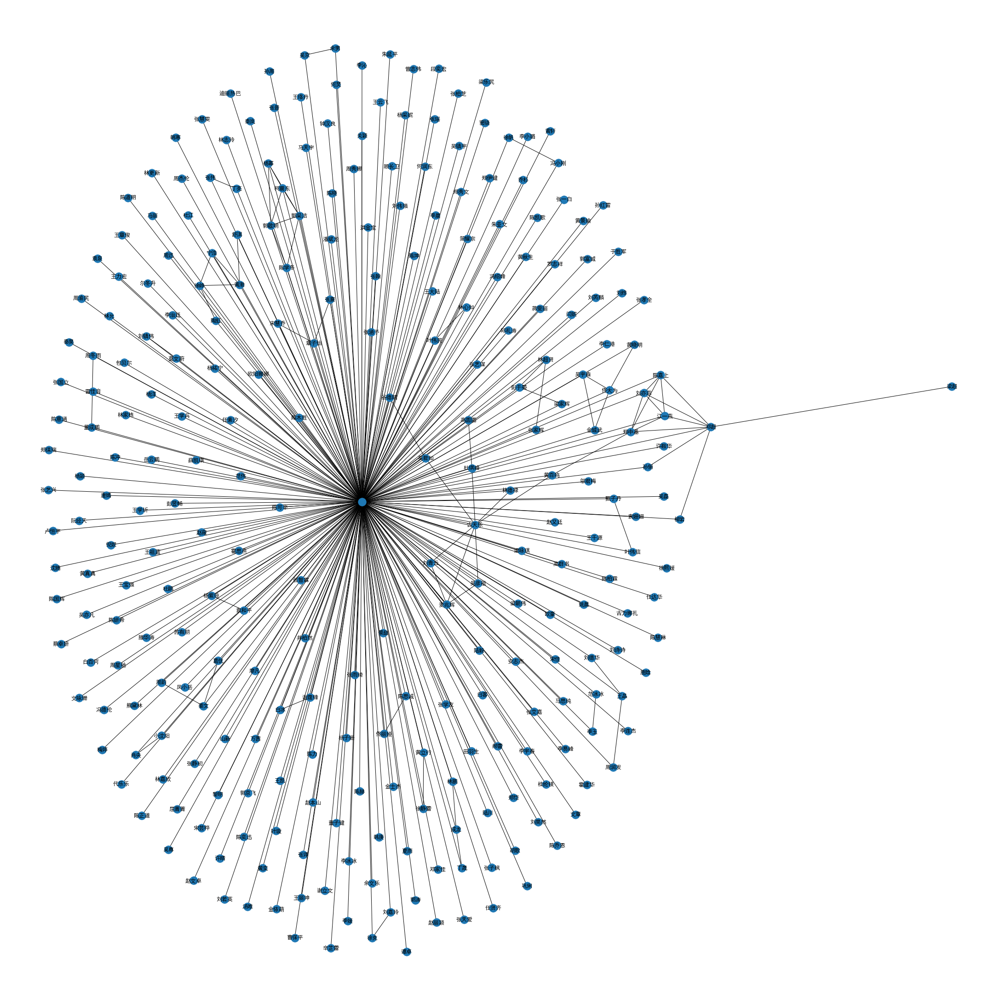

In [483]:
plt.figure(figsize=(30,30)) 

nx.draw(celebrity_network,with_labels = True)

plt.show()

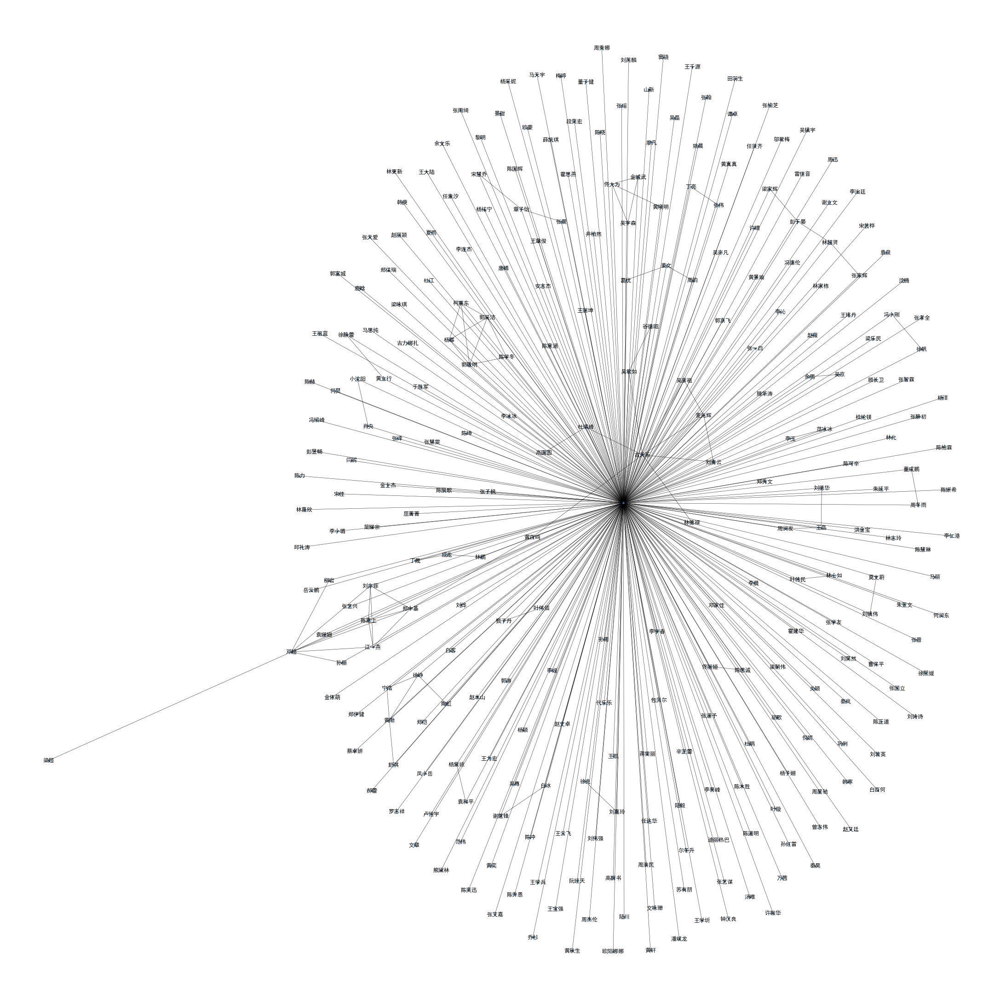

In [478]:
### We can now visualize the network we've just built!
plt.figure(figsize=(30,30)) 

nx.draw(G, node_size=10, width=0.5, with_labels=True)

plt.show()

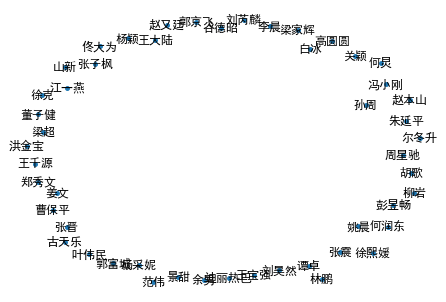

In [480]:
### We can induce a subgraph of the previous graph by 
### specifying which nodes should be in the subgraph

### Let's create a random sample of 30 people
sample= pd.Series(list(G.nodes)).sample(50)

### Call the subgraph function and pass the list of people
### In this case, we will pass our sample
SS= G.subgraph(sample)

### Let's look at the subgraph
nx.draw(SS, node_size=15, width=0.5, with_labels = True)
